In [1]:
%load_ext autoreload
%autoreload 2
from IPython.display import display

In [2]:
import os 

import pickle

import numpy as np

import pandas as pd

import statsmodels.api as sm
from statsmodels.graphics.gofplots import qqplot

import arviz as az
import pymc3 as pm

import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

from modules.models.stats import LMMPerformance
from modules.utils.general_utils.stats_utils import compute_cd_from_regression

WARNING (theano.configdefaults): g++ not available, if using conda: `conda install m2w64-toolchain`
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\theano\configdefaults.py:560: UserWarning: DeprecationWarning: there is no c++ compiler.This is deprecated and with Theano 0.11 a c++ compiler will be mandatory
  warnings.warn("DeprecationWarning: there is no c++ compiler."
WARNING (theano.configdefaults): g++ not detected ! Theano will be unable to execute optimized C-implementations (for both CPU and GPU) and will default to Python implementations. Performance will be severely degraded. To remove this warning, set Theano flags cxx to an empty string.
WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [3]:
pd.set_option('display.max_rows', None)

def sns_styleset():
    sns.set(context='paper', style='ticks', font='DejaVu Sans')
    matplotlib.rcParams['figure.dpi']        = 300
    matplotlib.rcParams['axes.linewidth']    = 1
    matplotlib.rcParams['xtick.major.width'] = 1
    matplotlib.rcParams['ytick.major.width'] = 1
    matplotlib.rcParams['xtick.major.size']  = 3
    matplotlib.rcParams['ytick.major.size']  = 3
    matplotlib.rcParams['xtick.minor.size']  = 2
    matplotlib.rcParams['ytick.minor.size']  = 2
    matplotlib.rcParams['font.size']         = 13
    matplotlib.rcParams['axes.titlesize']    = 13
    matplotlib.rcParams['axes.labelsize']    = 13
    matplotlib.rcParams['legend.fontsize']   = 13
    matplotlib.rcParams['xtick.labelsize']   = 13
    matplotlib.rcParams['ytick.labelsize']   = 13
    
sns_styleset()

# Load Data

In [4]:
final_results = []
for fold_n in range(8):

    final_results.append(
        pd.read_csv(f'results\\tables\\models_performance\\models_performance_fold_{fold_n}.csv')
    )

In [5]:
final_results = []
for fold_n in range(8):

    final_results.append(
        pd.read_csv(f'results\\tables\\models_performance\\models_performance_fold_{fold_n}.csv')
    )

final_results = pd.concat(final_results, ignore_index=True)
final_results = final_results.dropna()
final_results['time_epochs'] = final_results['fitting_time'] / final_results['epochs']
targets = final_results['target'].unique()
final_results.loc[final_results["context"] == "outriders", 'context'] = "outr"
final_results['Model'] = final_results['Model'].map(
    {
        'MLP': 'MLP',
        'RNN_env': 'RNN env',
        'RNN_even': 'RNN even',
        'RNN_env_even': "RNN env even",
        'RNN': 'RNN'
    }
)

targets = final_results['target'].unique()

        
comparisons = [
    ('MLP', 'RNN env'), 
    ('MLP', 'RNN env even'), 
    ('MLP', 'RNN even'), 
    ('RNN env', 'RNN env even'), 
    ('RNN env', 'RNN even'), 
    ('RNN env even', 'RNN even'), 
]
final_results["value"] = final_results["value"] * 100
final_results.to_csv('results\\tables\\models_performance\\models_performance_total.csv')

In [6]:
collapsed_target = final_results.groupby(['Model', 'Session', 'context', 'fold_n'])['value'].sum().reset_index()
collapsed_target["value"] = collapsed_target["value"] / 5
collapsed_time = final_results.groupby(['Model', 'target', 'fold_n', 'context'])['value'].mean().reset_index()
collapsed_context = final_results.groupby(['Model', 'target', 'fold_n', 'Session'])['value'].mean().reset_index()
collapsed_anova = collapsed_target.groupby(['Model', 'fold_n'])['value'].mean().reset_index()

# Performance Visualization

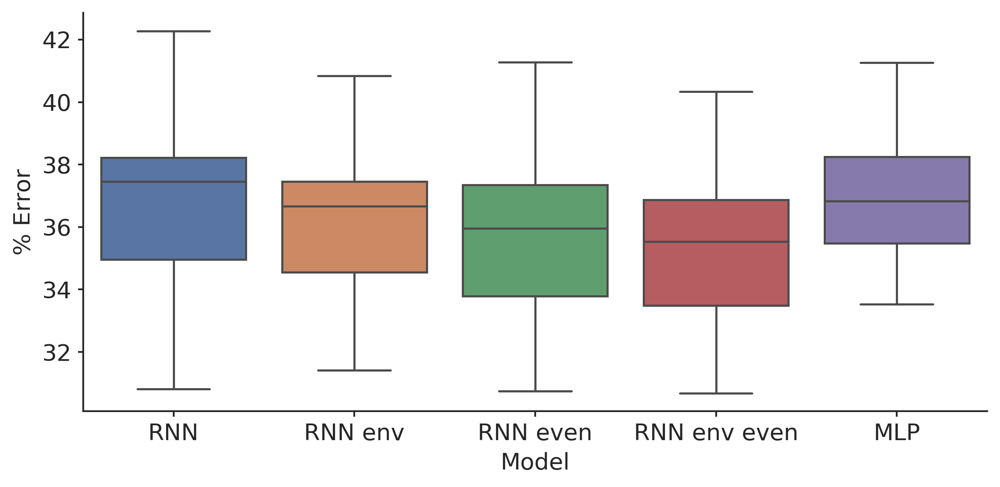

In [8]:
plt.figure(figsize=(8, 4))
ax = sns.boxplot(
    x='Model', 
    y='value', 
    data=collapsed_target, 
    order=['RNN', 'RNN env', 'RNN even', 'RNN env even', 'MLP']
)
plt.ylabel('% Error')
sns.despine()
plt.tight_layout()
plt.savefig("results\\figures\\models_performance\\performance_collapsed.png", dpi=300)
plt.show()

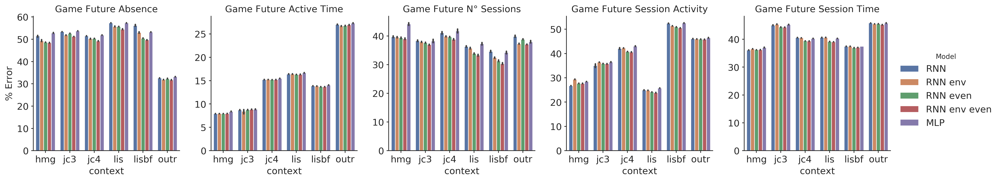

In [9]:
box_plots = sns.catplot(
    x='context', 
    y='value', 
    col='target',
    hue='Model',
    kind='bar',
    data=collapsed_time,
    hue_order=['RNN', 'RNN env', 'RNN even', 'RNN env even', 'MLP'],
    col_wrap=5,
    height=3.5,
    sharey=False
)
box_plots.set_titles('Game {col_name}')
box_plots.set_ylabels('% Error')
plt.savefig("results\\figures\\models_performance\\models_comparison_collapsed_time.png", dpi=300)
plt.show()

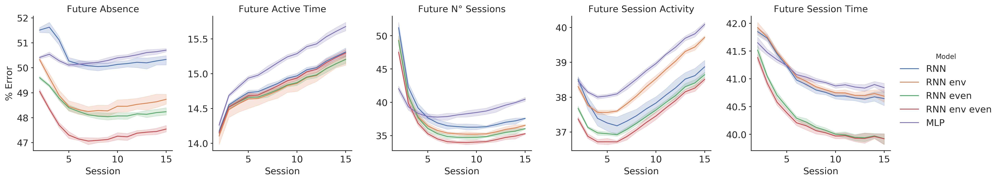

In [10]:
line_plots = sns.relplot(
    x='Session', 
    y='value', 
    hue='Model',
    col='target',
    kind='line',
    hue_order=['RNN', 'RNN env', 'RNN even', 'RNN env even', 'MLP'],
    data=collapsed_context,
    col_wrap=5,
    height=3.5,
    facet_kws={'sharey': False}
)
line_plots.set_titles('{col_name}')
line_plots.set_ylabels('% Error')
plt.savefig("results\\figures\\models_performance\\models_comparison_collapsed_game.png", dpi=300)
plt.show()

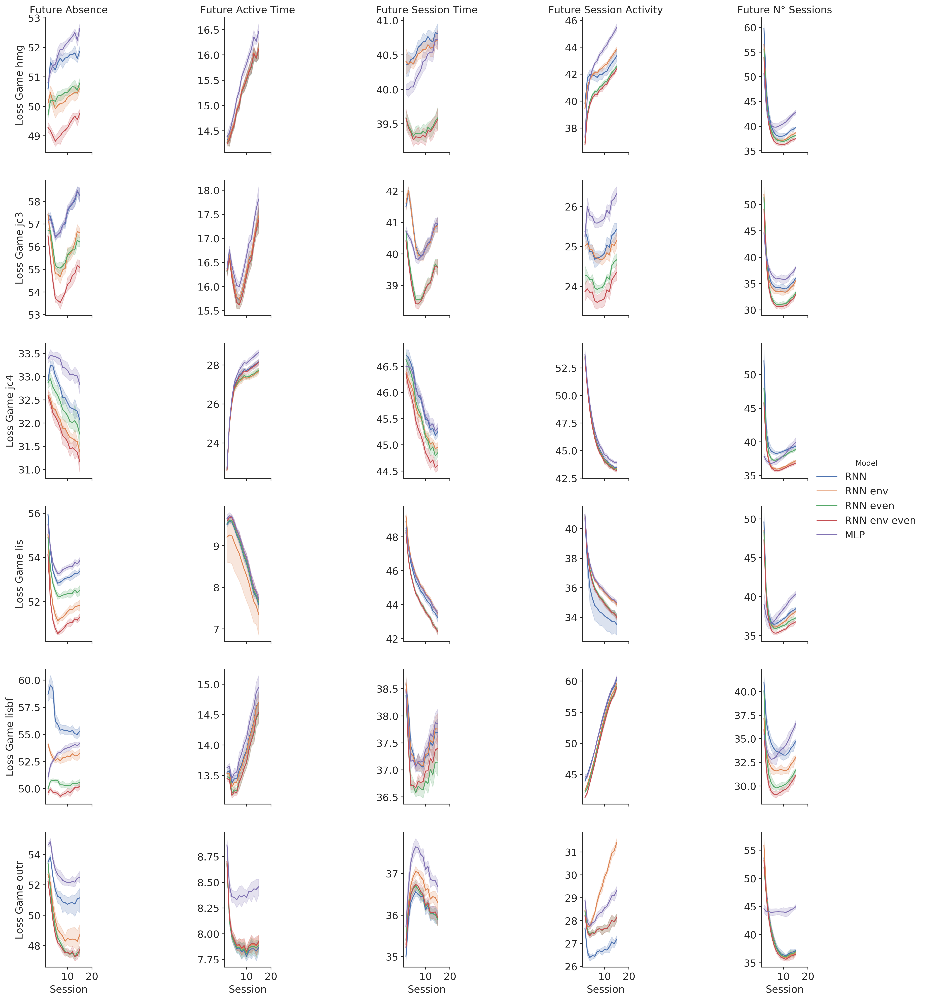

In [11]:
line_plots = sns.relplot(
    x='Session', 
    y='value', 
    hue='Model',
    col='target',
    row='context',
    kind='line',
    hue_order=['RNN', 'RNN env', 'RNN even', 'RNN env even', 'MLP'],
    data=final_results,
    height=3,
    facet_kws={'sharey': False}
)
line_plots.set_titles('')

for column, target in enumerate([
    'Future Absence',    
    'Future Active Time',
    'Future Session Time',
    'Future Session Activity',
    'Future N° Sessions'
]):
    
    line_plots.axes[0, column].set_title(target)
    
for row, game in enumerate([
    'hmg',
    'jc3',
    'jc4',
    'lis',
    'lisbf',
    'outr'
]):
    line_plots.axes[row, 0].set_ylabel(f'Loss Game {game}')

plt.xlim(1, 20)
plt.savefig("results\\figures\\models_performance\\models_comparison_non_collapsed.png", dpi=300)
plt.show()

# Statistical Analysis: Linear Mixed Model

# Frequentist

In [12]:
vcf = {'context': '0 + C(context)', 'Session': '0 + C(Session)'}
final_results['group'] = 1
collapsed_target['group'] =1

contrasts = np.array(
    [
        [0, 1, -1, 0, 0], # MLP - RNN env
        [0, 1, 0, -1, 0], # MLP - RNN env even
        [0, 1, 0, 0, -1], # MLP - RNN even
        [0, 0, 1, -1, 0], # RNN env - RNN env even
        [0, 0, 1, 0, -1], # RNN env - RNN even
        [0, 0, 0, 1, -1]  # RNN env even - RNN even
    ]
)

### LMM Collapsed Target

In [13]:
model = sm.MixedLM.from_formula(
    "value ~ C(Model, Treatment(reference='RNN'))", 
    groups='group',                                                    
    vc_formula=vcf, 
    re_formula='0', 
    data=collapsed_target
)                                                   
result = model.fit(maxiter=10000, method="powell")
display(result.summary())

<class 'statsmodels.iolib.summary2.Summary'>
"""
                             Mixed Linear Model Regression Results
================================================================================================
Model:                          MixedLM              Dependent Variable:              value     
No. Observations:               3360                 Method:                          REML      
No. Groups:                     1                    Scale:                           0.7839    
Min. group size:                3360                 Log-Likelihood:                  -4422.3192
Max. group size:                3360                 Converged:                       Yes       
Mean group size:                3360.0                                                          
------------------------------------------------------------------------------------------------
                                                     Coef.  Std.Err.    z    P>|z| [0.025 0.975]
------------------------------------------------------------------------------------------------
Intercept                                            36.518    0.883  41.374 0.000 34.788 38.248
C(Model, Treatment(reference='RNN'))[T.MLP]           0.366    0.048   7.569 0.000  0.271  0.460
C(Model, Treatment(reference='RNN'))[T.RNN env]      -0.494    0.048 -10.224 0.000 -0.589 -0.399
C(Model, Treatment(reference='RNN'))[T.RNN env even] -1.325    0.048 -27.424 0.000 -1.419 -1.230
C(Model, Treatment(reference='RNN'))[T.RNN even]     -0.938    0.048 -19.414 0.000 -1.032 -0.843
Session Var                                           0.589    0.262                            
context Var                                           4.415    3.155                            
================================================================================================

"""

### Standardized Effect Sizes

In [14]:
residuals_df = pd.DataFrame(
    {
        'Residuals': result.resid,
        'Model': collapsed_target['Model'].values
    }
)

n = len(residuals_df[residuals_df['Model'] == 'RNN']['Residuals'])
var_1 = residuals_df[residuals_df['Model'] == 'RNN']['Residuals'].var()

std_effect_sizes = pd.DataFrame(
    columns=[
        'Model',
        'Coeff',
        "Cohen's d"
    ]
)
for index, model in enumerate(['MLP', 'RNN env', 'RNN env even', 'RNN even'], 1):

    var_2 = residuals_df[residuals_df['Model'] == model]['Residuals'].var()
    beta = result.params[index]
    cd = compute_cd_from_regression(
        beta=beta,
        var_1=var_1,
        var_2=var_2,
        n_1=n,
        n_2=n
    )
    std_effect_sizes.loc[index - 1] = [
        model,
        beta,
        cd
    ]
    
std_effect_sizes

,Model,Coeff,Cohen's d
0,MLP,0.365593,0.388814
1,RNN env,-0.493836,-0.599691
2,RNN env even,-1.324638,-1.536510
3,RNN even,-0.937723,-1.109009


In [15]:
summary_post_hoc = result.t_test(contrasts).summary()
results_as_html = summary_post_hoc.as_html()
summary_post_hoc = pd.read_html(results_as_html, header=0, index_col=0)[0]
summary_post_hoc = summary_post_hoc.reset_index()
summary_post_hoc = summary_post_hoc.rename(
    {
        'index': 'Contrast'
    },
    axis=1
)

summary_post_hoc['Contrast'] = summary_post_hoc['Contrast'].map(
    {
        'c0': 'MLP - RNN env',
        'c1': 'MLP - RNN env even',
        'c2': 'MLP - RNN even',
        'c3': 'RNN env - RNN env even',
        'c4': 'RNN env - RNN even',
        'c5': ' RNN env even - RNN even'
    }
)
display(summary_post_hoc)

,Contrast,coef,std err,z,P>|z|,[0.025,0.975]
0,MLP - RNN env,0.8594,0.048,17.793,0.0,0.765,0.954
1,MLP - RNN env even,1.6902,0.048,34.993,0.0,1.596,1.785
2,MLP - RNN even,1.3033,0.048,26.983,0.0,1.209,1.398
3,RNN env - RNN env even,0.8308,0.048,17.200,0.0,0.736,0.925
4,RNN env - RNN even,0.4439,0.048,9.190,0.0,0.349,0.539
5,RNN env even - RNN even,-0.3869,0.048,-8.010,0.0,-0.482,-0.292


### LMM Exploded

In [22]:
for target in final_results['target'].unique():
    
    print(target)
    
    data = final_results[final_results['target'] == target]
    model = sm.MixedLM.from_formula(
        "value ~ C(Model, Treatment(reference='RNN') )", 
        groups='fold_n',                                                    
        vc_formula=vcf, 
        re_formula='0', 
        data=data
    )                                                   
    result = model.fit(maxiter=10000, method="powell")
    residuals_df = pd.DataFrame(
        {
            'Residuals': result.resid,
            'Model': collapsed_target['Model'].values
        }
    )
    
    n = len(residuals_df[residuals_df['Model'] == 'RNN']['Residuals'])
    var_1 = residuals_df[residuals_df['Model'] == 'RNN']['Residuals'].var()

    std_effect_sizes = pd.DataFrame(
        columns=[
            'Model',
            'Coeff',
            "Cohen's d"
        ]
    )
    for index, model in enumerate(['MLP', 'RNN env', 'RNN env even', 'RNN even'], 1):

        var_2 = residuals_df[residuals_df['Model'] == model]['Residuals'].var()
        beta = result.params[index]
        cd = compute_cd_from_regression(
            beta=beta,
            var_1=var_1,
            var_2=var_2,
            n_1=n,
            n_2=n
        )
        std_effect_sizes.loc[index - 1] = [
            model,
            beta,
            cd
        ]
    
    summary_post_hoc = result.t_test(contrasts).summary()
    results_as_html = summary_post_hoc.as_html()
    summary_post_hoc = pd.read_html(results_as_html, header=0, index_col=0)[0]
    summary_post_hoc = summary_post_hoc.reset_index()
    summary_post_hoc = summary_post_hoc.rename(
        {
            'index': 'Contrast'
        },
        axis=1
    )
    summary_post_hoc['Contrast'] = summary_post_hoc['Contrast'].map(
        {
            'c0': 'MLP - RNN env',
            'c1': 'MLP - RNN env even',
            'c2': 'MLP - RNN even',
            'c3': 'RNN env - RNN env even',
            'c4': 'RNN env - RNN even',
            'c5': ' RNN env even - RNN even'
        }
    )
    summary_post_hoc['P>|z|'] = summary_post_hoc['P>|z|'].values * 6
    summary_post_hoc['P>|z|'] = summary_post_hoc['P>|z|'].apply(lambda x: min(1., x))
    print('Regression Results')
    display(result.summary())
    print('Standardized Effect Size')
    display(std_effect_sizes)
    print('Post Hoc')
    display(summary_post_hoc)

Future Absence
Regression Results


<class 'statsmodels.iolib.summary2.Summary'>
"""
                             Mixed Linear Model Regression Results
================================================================================================
Model:                          MixedLM              Dependent Variable:              value     
No. Observations:               3360                 Method:                          REML      
No. Groups:                     8                    Scale:                           1.1882    
Min. group size:                420                  Log-Likelihood:                  -5345.1875
Max. group size:                420                  Converged:                       Yes       
Mean group size:                420.0                                                           
------------------------------------------------------------------------------------------------
                                                     Coef.  Std.Err.    z    P>|z| [0.025 0.975]
------------------------------------------------------------------------------------------------
Intercept                                            50.444    1.194  42.240 0.000 48.103 52.784
C(Model, Treatment(reference='RNN'))[T.MLP]          -0.050    0.059  -0.845 0.398 -0.167  0.066
C(Model, Treatment(reference='RNN'))[T.RNN env]      -1.743    0.059 -29.303 0.000 -1.859 -1.626
C(Model, Treatment(reference='RNN'))[T.RNN env even] -2.935    0.059 -49.348 0.000 -3.051 -2.818
C(Model, Treatment(reference='RNN'))[T.RNN even]     -2.058    0.059 -34.604 0.000 -2.174 -1.941
Session Var                                           0.160    0.025                            
context Var                                          68.302   14.767                            
================================================================================================

"""

Standardized Effect Size


,Model,Coeff,Cohen's d
0,MLP,-0.050229,-0.045206
1,RNN env,-1.742526,-1.625441
2,RNN env even,-2.934545,-2.663491
3,RNN even,-2.057777,-1.861304


Post Hoc


,Contrast,coef,std err,z,P>|z|,[0.025,0.975]
0,MLP - RNN env,1.6923,0.059,28.458,0.0,1.576,1.809
1,MLP - RNN env even,2.8843,0.059,48.503,0.0,2.768,3.001
2,MLP - RNN even,2.0075,0.059,33.759,0.0,1.891,2.124
3,RNN env - RNN env even,1.1920,0.059,20.045,0.0,1.075,1.309
4,RNN env - RNN even,0.3153,0.059,5.301,0.0,0.199,0.432
5,RNN env even - RNN even,-0.8768,0.059,-14.744,0.0,-0.993,-0.760


Future Active Time
Regression Results


<class 'statsmodels.iolib.summary2.Summary'>
"""
                             Mixed Linear Model Regression Results
===============================================================================================
Model:                         MixedLM              Dependent Variable:              value     
No. Observations:              3360                 Method:                          REML      
No. Groups:                    8                    Scale:                           0.5503    
Min. group size:               420                  Log-Likelihood:                  -4067.4733
Max. group size:               420                  Converged:                       Yes       
Mean group size:               420.0                                                           
-----------------------------------------------------------------------------------------------
                                                     Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-----------------------------------------------------------------------------------------------
Intercept                                            14.877    0.992 14.991 0.000 12.932 16.822
C(Model, Treatment(reference='RNN'))[T.MLP]           0.269    0.040  6.653 0.000  0.190  0.349
C(Model, Treatment(reference='RNN'))[T.RNN env]      -0.098    0.040 -2.417 0.016 -0.177 -0.019
C(Model, Treatment(reference='RNN'))[T.RNN env even] -0.031    0.040 -0.776 0.438 -0.111  0.048
C(Model, Treatment(reference='RNN'))[T.RNN even]     -0.082    0.040 -2.021 0.043 -0.161 -0.002
Session Var                                           0.081    0.019                           
context Var                                          47.202   15.964                           
===============================================================================================

"""

Standardized Effect Size


,Model,Coeff,Cohen's d
0,MLP,0.269240,0.384566
1,RNN env,-0.097833,-0.140103
2,RNN env even,-0.031393,-0.043571
3,RNN even,-0.081778,-0.110307


Post Hoc


,Contrast,coef,std err,z,P>|z|,[0.025,0.975]
0,MLP - RNN env,0.3671,0.04,9.070,0.000,0.288,0.446
1,MLP - RNN env even,0.3006,0.04,7.428,0.000,0.221,0.380
2,MLP - RNN even,0.3510,0.04,8.673,0.000,0.272,0.430
3,RNN env - RNN env even,-0.0664,0.04,-1.642,0.606,-0.146,0.013
4,RNN env - RNN even,-0.0161,0.04,-0.397,1.000,-0.095,0.063
5,RNN env even - RNN even,0.0504,0.04,1.245,1.000,-0.029,0.130


Future Session Time
Regression Results


<class 'statsmodels.iolib.summary2.Summary'>
"""
                             Mixed Linear Model Regression Results
================================================================================================
Model:                          MixedLM              Dependent Variable:              value     
No. Observations:               3360                 Method:                          REML      
No. Groups:                     8                    Scale:                           0.5297    
Min. group size:                420                  Log-Likelihood:                  -4002.7561
Max. group size:                420                  Converged:                       Yes       
Mean group size:                420.0                                                           
------------------------------------------------------------------------------------------------
                                                     Coef.  Std.Err.    z    P>|z| [0.025 0.975]
------------------------------------------------------------------------------------------------
Intercept                                            40.978    0.526  77.831 0.000 39.946 42.010
C(Model, Treatment(reference='RNN'))[T.MLP]           0.087    0.040   2.198 0.028  0.009  0.165
C(Model, Treatment(reference='RNN'))[T.RNN env]       0.051    0.040   1.280 0.200 -0.027  0.129
C(Model, Treatment(reference='RNN'))[T.RNN env even] -0.734    0.040 -18.488 0.000 -0.812 -0.656
C(Model, Treatment(reference='RNN'))[T.RNN even]     -0.674    0.040 -16.981 0.000 -0.752 -0.596
Session Var                                           0.148    0.032                            
context Var                                          13.204    4.054                            
================================================================================================

"""

Standardized Effect Size


,Model,Coeff,Cohen's d
0,MLP,0.087263,0.123062
1,RNN env,0.050832,0.071019
2,RNN env even,-0.734094,-1.028797
3,RNN even,-0.674258,-0.943305


Post Hoc


,Contrast,coef,std err,z,P>|z|,[0.025,0.975]
0,MLP - RNN env,0.0364,0.04,0.918,1.000,-0.041,0.114
1,MLP - RNN env even,0.8214,0.04,20.686,0.000,0.744,0.899
2,MLP - RNN even,0.7615,0.04,19.179,0.000,0.684,0.839
3,RNN env - RNN env even,0.7849,0.04,19.768,0.000,0.707,0.863
4,RNN env - RNN even,0.7251,0.04,18.261,0.000,0.647,0.803
5,RNN env even - RNN even,-0.0598,0.04,-1.507,0.792,-0.138,0.018


Future Session Activity
Regression Results


<class 'statsmodels.iolib.summary2.Summary'>
"""
                             Mixed Linear Model Regression Results
===============================================================================================
Model:                         MixedLM              Dependent Variable:              value     
No. Observations:              3360                 Method:                          REML      
No. Groups:                    8                    Scale:                           7.8911    
Min. group size:               420                  Log-Likelihood:                  -8422.8160
Max. group size:               420                  Converged:                       Yes       
Mean group size:               420.0                                                           
-----------------------------------------------------------------------------------------------
                                                     Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-----------------------------------------------------------------------------------------------
Intercept                                            37.914    1.392 27.243 0.000 35.186 40.642
C(Model, Treatment(reference='RNN'))[T.MLP]           0.910    0.153  5.938 0.000  0.610  1.210
C(Model, Treatment(reference='RNN'))[T.RNN env]       0.498    0.153  3.251 0.001  0.198  0.799
C(Model, Treatment(reference='RNN'))[T.RNN env even] -0.513    0.153 -3.350 0.001 -0.814 -0.213
C(Model, Treatment(reference='RNN'))[T.RNN even]     -0.320    0.153 -2.091 0.037 -0.621 -0.020
Session Var                                           0.147    0.021                           
context Var                                          92.343    6.839                           
===============================================================================================

"""

Standardized Effect Size


,Model,Coeff,Cohen's d
0,MLP,0.910068,0.329273
1,RNN env,0.498192,0.181728
2,RNN env even,-0.513443,-0.186478
3,RNN even,-0.320371,-0.116332


Post Hoc


,Contrast,coef,std err,z,P>|z|,[0.025,0.975]
0,MLP - RNN env,0.4119,0.153,2.688,0.042,0.112,0.712
1,MLP - RNN env even,1.4235,0.153,9.289,0.000,1.123,1.724
2,MLP - RNN even,1.2304,0.153,8.029,0.000,0.930,1.531
3,RNN env - RNN env even,1.0116,0.153,6.601,0.000,0.711,1.312
4,RNN env - RNN even,0.8186,0.153,5.341,0.000,0.518,1.119
5,RNN env even - RNN even,-0.1931,0.153,-1.260,1.000,-0.493,0.107


Future N° Sessions
Regression Results


<class 'statsmodels.iolib.summary2.Summary'>
"""
                             Mixed Linear Model Regression Results
================================================================================================
Model:                          MixedLM              Dependent Variable:              value     
No. Observations:               3360                 Method:                          REML      
No. Groups:                     8                    Scale:                           4.7608    
Min. group size:                420                  Log-Likelihood:                  -7727.1805
Max. group size:                420                  Converged:                       Yes       
Mean group size:                420.0                                                           
------------------------------------------------------------------------------------------------
                                                     Coef.  Std.Err.    z    P>|z| [0.025 0.975]
------------------------------------------------------------------------------------------------
Intercept                                            38.376    0.519  73.913 0.000 37.358 39.393
C(Model, Treatment(reference='RNN'))[T.MLP]           0.612    0.119   5.138 0.000  0.378  0.845
C(Model, Treatment(reference='RNN'))[T.RNN env]      -1.178    0.119  -9.895 0.000 -1.411 -0.945
C(Model, Treatment(reference='RNN'))[T.RNN env even] -2.410    0.119 -20.244 0.000 -2.643 -2.176
C(Model, Treatment(reference='RNN'))[T.RNN even]     -1.554    0.119 -13.059 0.000 -1.788 -1.321
Session Var                                          10.481    0.674                            
context Var                                           8.107    0.787                            
================================================================================================

"""

Standardized Effect Size


,Model,Coeff,Cohen's d
0,MLP,0.611622,0.285697
1,RNN env,-1.177846,-0.543274
2,RNN env even,-2.409713,-1.087708
3,RNN even,-1.554433,-0.715076


Post Hoc


,Contrast,coef,std err,z,P>|z|,[0.025,0.975]
0,MLP - RNN env,1.7895,0.119,15.033,0.000,1.556,2.023
1,MLP - RNN env even,3.0213,0.119,25.382,0.000,2.788,3.255
2,MLP - RNN even,2.1661,0.119,18.197,0.000,1.933,2.399
3,RNN env - RNN env even,1.2319,0.119,10.349,0.000,0.999,1.465
4,RNN env - RNN even,0.3766,0.119,3.164,0.012,0.143,0.610
5,RNN env even - RNN even,-0.8553,0.119,-7.185,0.000,-1.089,-0.622


# Bayesian

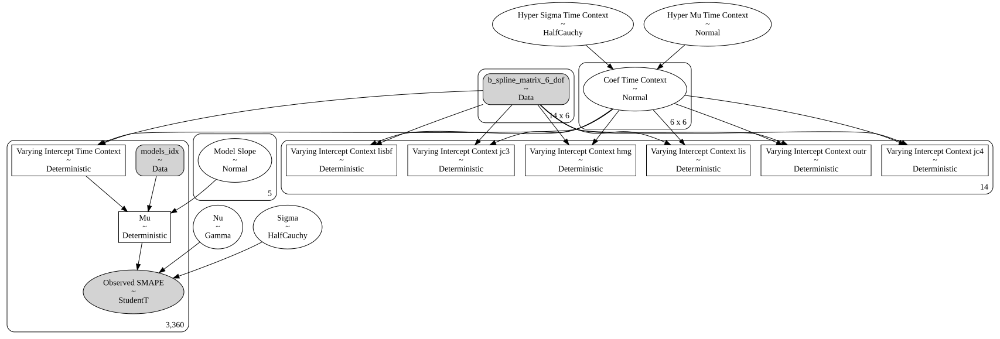

Finished [100%]: Average Loss = 2,791
INFO:pymc3.variational.inference:Finished [100%]: Average Loss = 2,791


collapsed


arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)
arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Varying Intercept Context hmg[0],28.600,0.084,28.448,28.757,0.003,0.002,1011.0,895.0,NaN
Varying Intercept Context hmg[1],27.019,0.055,26.912,27.110,0.002,0.001,959.0,764.0,NaN
Varying Intercept Context hmg[2],26.017,0.052,25.927,26.120,0.002,0.001,961.0,900.0,NaN
Varying Intercept Context hmg[3],25.428,0.048,25.338,25.515,0.002,0.001,1004.0,908.0,NaN
Varying Intercept Context hmg[4],25.086,0.044,25.007,25.168,0.001,0.001,1038.0,881.0,NaN
Varying Intercept Context hmg[5],24.835,0.043,24.747,24.904,0.001,0.001,1023.0,979.0,NaN
Varying Intercept Context hmg[6],24.620,0.042,24.542,24.694,0.001,0.001,981.0,897.0,NaN
Varying Intercept Context hmg[7],24.457,0.043,24.388,24.545,0.001,0.001,969.0,833.0,NaN
Varying Intercept Context hmg[8],24.359,0.043,24.280,24.439,0.001,0.001,985.0,859.0,NaN
Varying Intercept Context hmg[9],24.343,0.044,24.260,24.418,0.001,0.001,948.0,815.0,NaN


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Model Slope[0],8.259,0.022,8.218,8.299,0.001,0.001,953.0,944.0,NaN
Model Slope[1],7.716,0.019,7.682,7.752,0.001,0.000,1026.0,1024.0,NaN
Model Slope[2],7.321,0.017,7.287,7.353,0.001,0.000,907.0,904.0,NaN
Model Slope[3],6.509,0.016,6.479,6.541,0.001,0.000,968.0,701.0,NaN
Model Slope[4],6.878,0.018,6.843,6.911,0.001,0.000,962.0,908.0,NaN
Nu,3.191,0.155,2.897,3.470,0.005,0.003,1009.0,983.0,NaN
Sigma,0.355,0.006,0.343,0.367,0.000,0.000,968.0,942.0,NaN


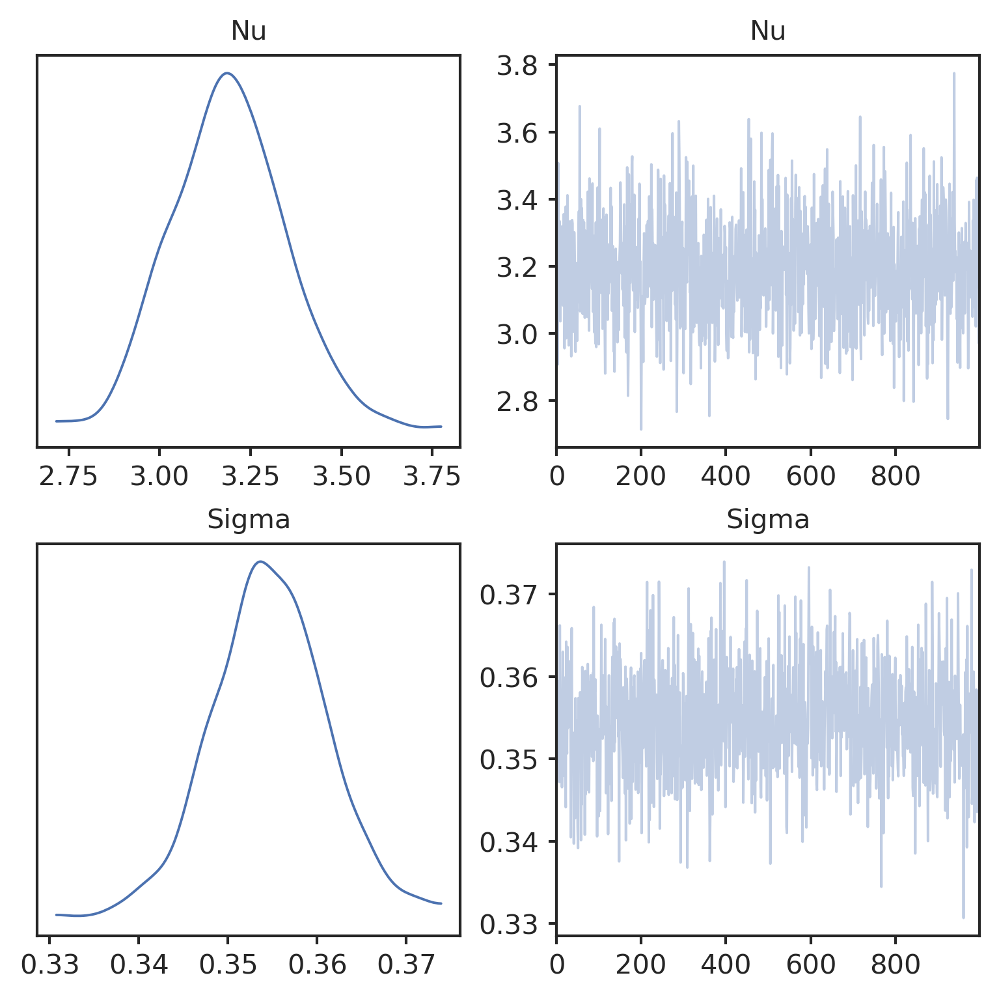

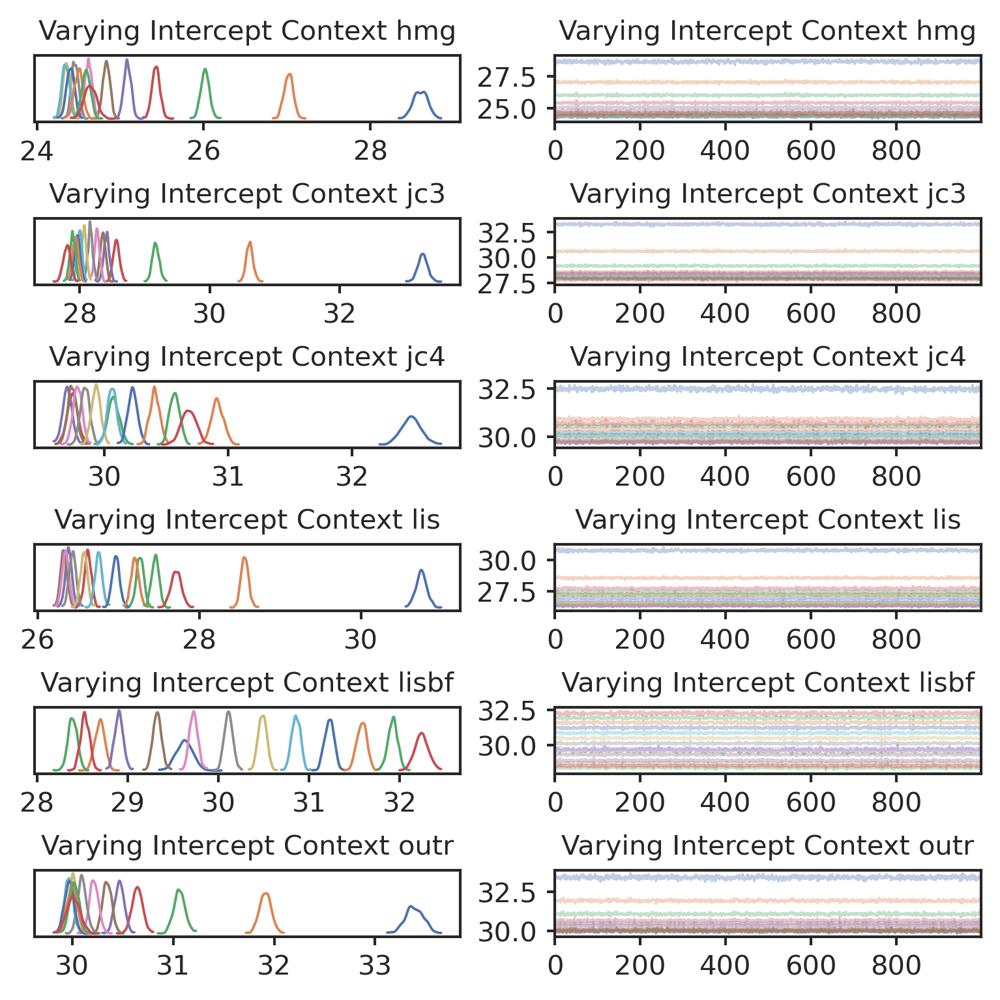

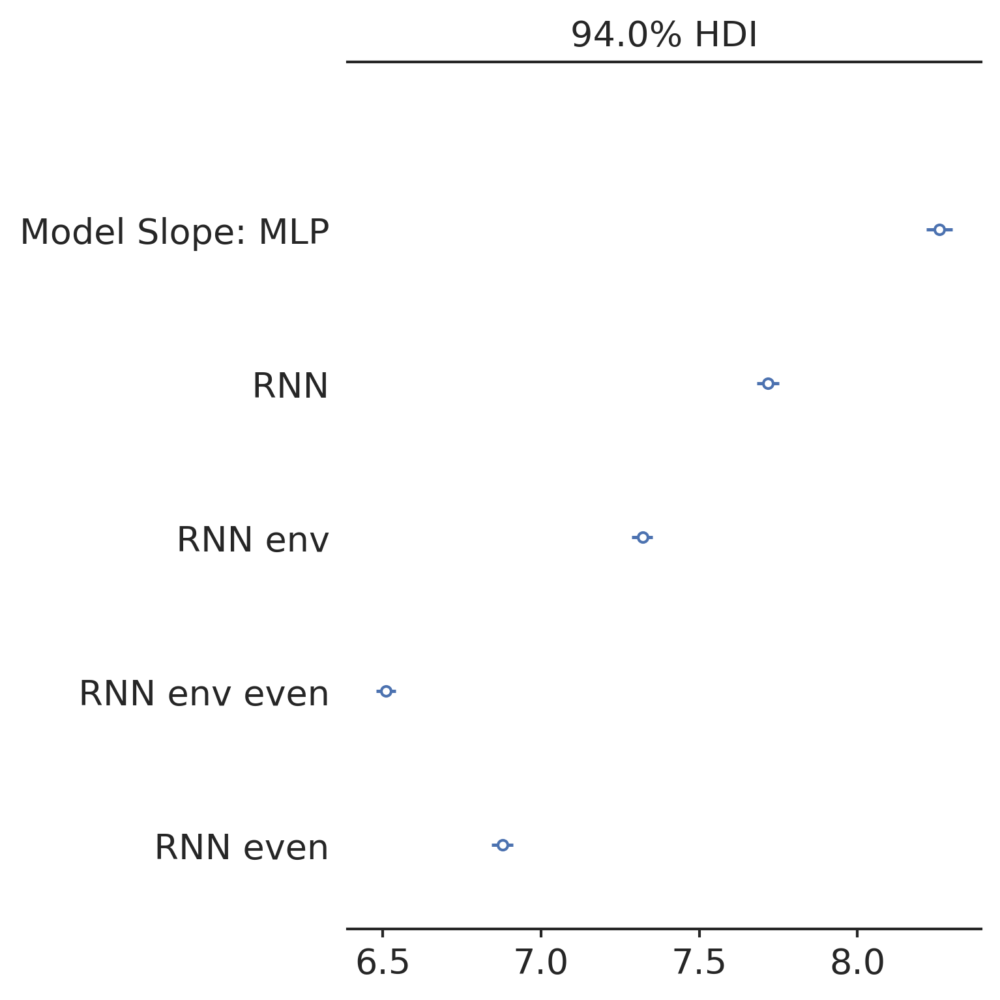

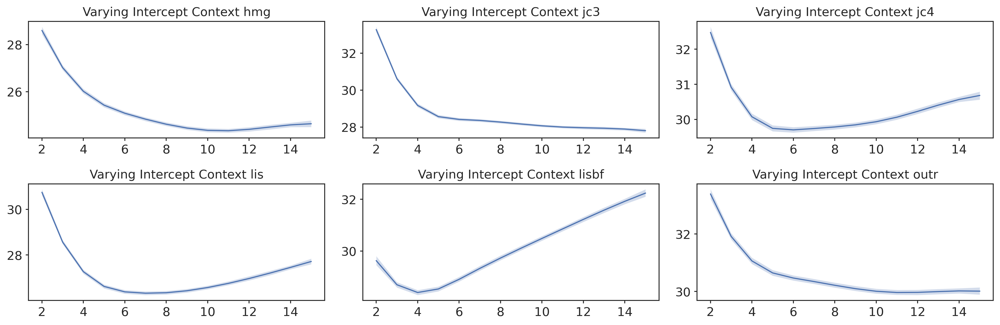

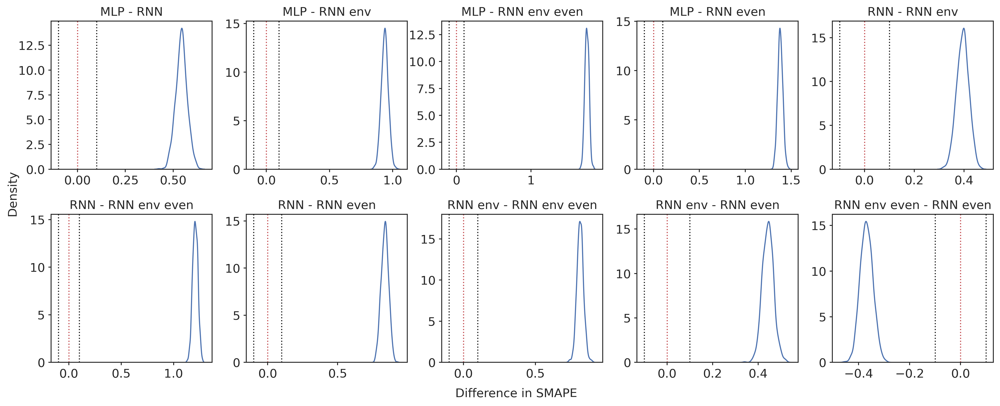

In [15]:
collapsed_target["Session_corr"] = collapsed_target["Session"] - 2
model = LMMPerformance(
    df=collapsed_target, 
    models_column='Model', 
    contexts_column='context', 
    time_column='Session_corr',
    outcomes_column='value', 
    robust=True
)
model.analyze(
    targets=["collapsed"], 
    approx=True, 
    n=800000
)

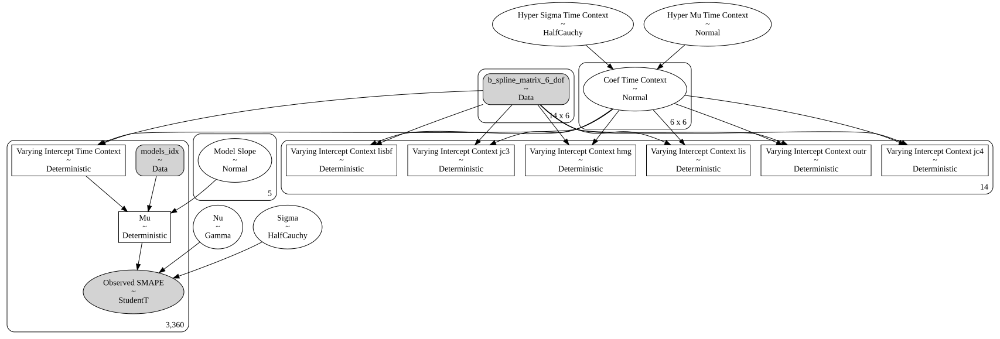

Finished [100%]: Average Loss = 4,440.7
INFO:pymc3.variational.inference:Finished [100%]: Average Loss = 4,440.7


Future Absence


arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)
arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Varying Intercept Context jc4[0],43.016,0.095,42.850,43.202,0.003,0.002,895.0,943.0,NaN
Varying Intercept Context jc4[1],43.189,0.062,43.083,43.316,0.002,0.001,1004.0,804.0,NaN
Varying Intercept Context jc4[2],43.266,0.061,43.158,43.383,0.002,0.001,969.0,789.0,NaN
Varying Intercept Context jc4[3],43.290,0.058,43.177,43.390,0.002,0.001,996.0,786.0,NaN
Varying Intercept Context jc4[4],43.308,0.054,43.214,43.416,0.002,0.001,961.0,751.0,NaN
Varying Intercept Context jc4[5],43.363,0.053,43.266,43.458,0.002,0.001,926.0,908.0,NaN
Varying Intercept Context jc4[6],43.455,0.052,43.355,43.548,0.002,0.001,910.0,908.0,NaN
Varying Intercept Context jc4[7],43.563,0.051,43.474,43.664,0.002,0.001,912.0,983.0,NaN
Varying Intercept Context jc4[8],43.662,0.050,43.566,43.753,0.002,0.001,920.0,944.0,NaN
Varying Intercept Context jc4[9],43.729,0.051,43.633,43.818,0.002,0.001,895.0,1067.0,NaN


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Model Slope[0],8.122,0.031,8.070,8.184,0.001,0.001,926.0,942.0,NaN
Model Slope[1],6.723,0.027,6.670,6.773,0.001,0.001,718.0,983.0,NaN
Model Slope[2],6.798,0.028,6.749,6.854,0.001,0.001,901.0,982.0,NaN
Model Slope[3],5.774,0.027,5.725,5.822,0.001,0.001,955.0,819.0,NaN
Model Slope[4],8.401,0.025,8.353,8.448,0.001,0.001,1065.0,876.0,NaN
Nu,2.205,0.091,2.040,2.379,0.003,0.002,991.0,944.0,NaN
Sigma,0.497,0.010,0.478,0.515,0.000,0.000,1068.0,984.0,NaN


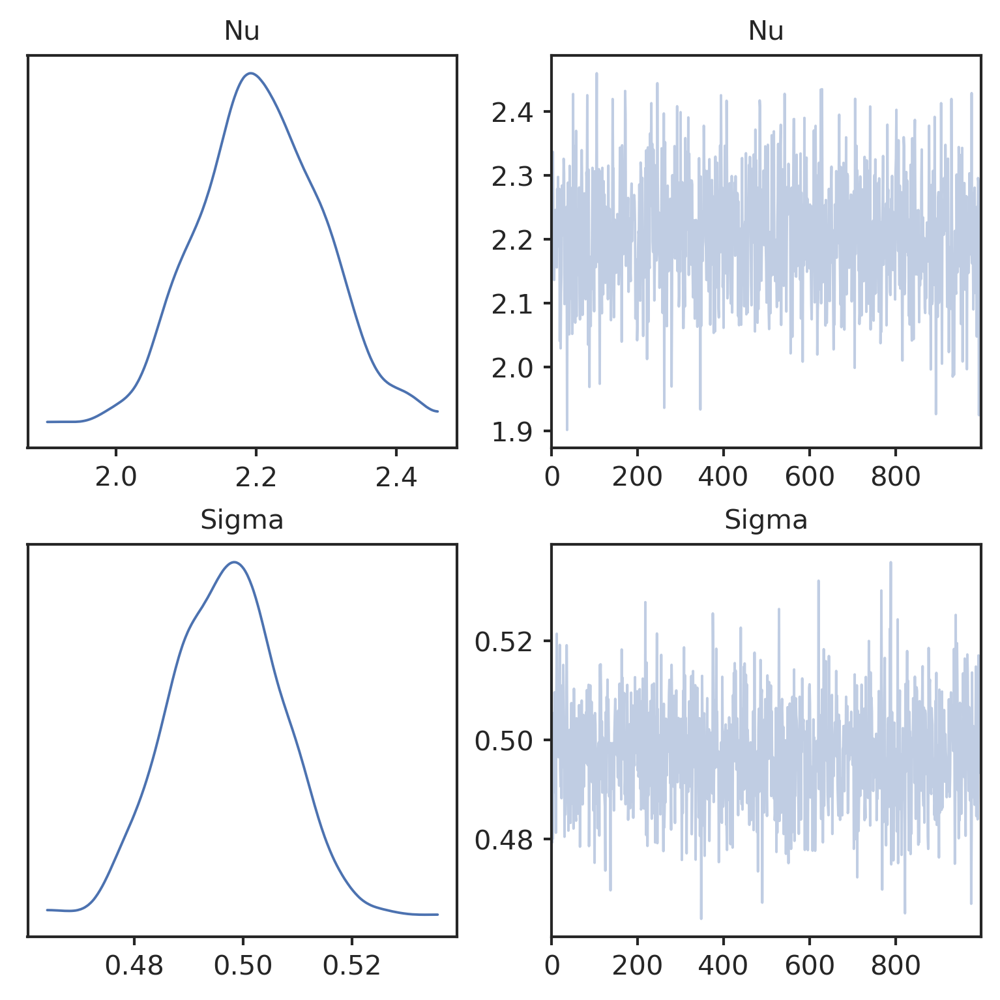

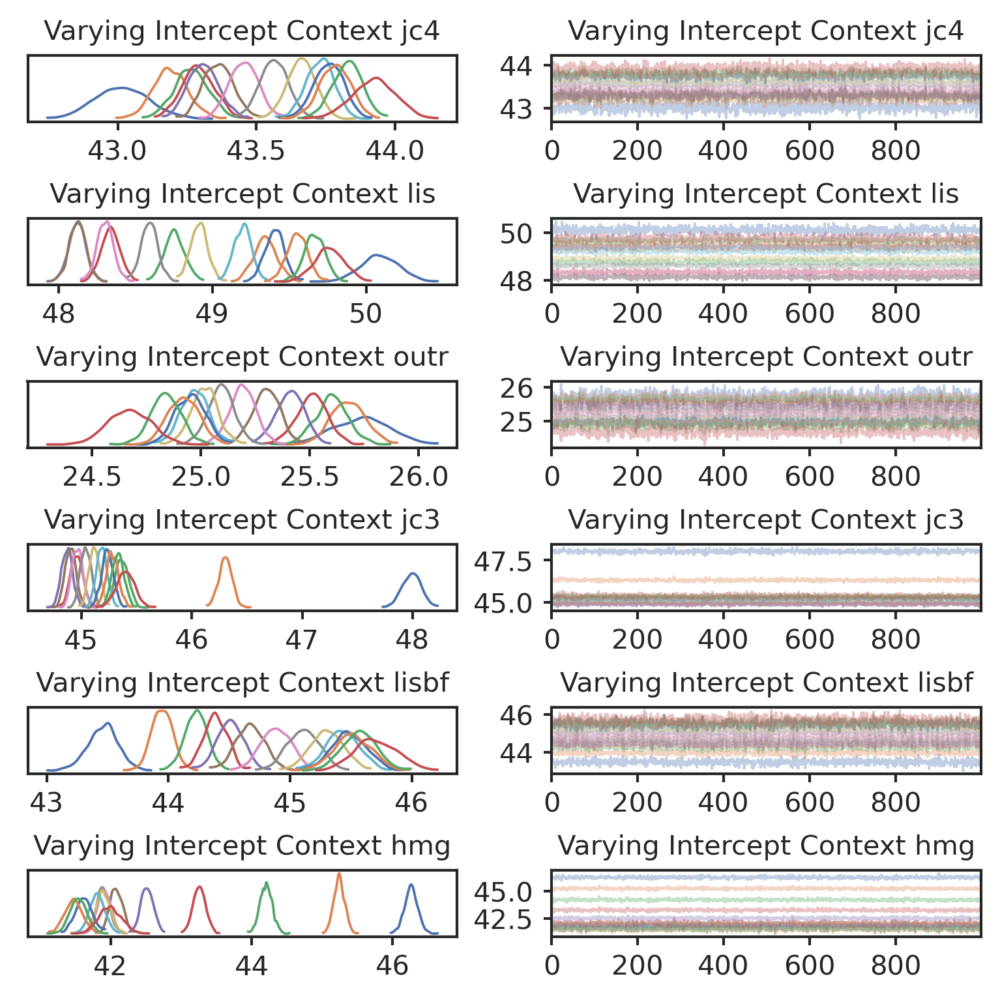

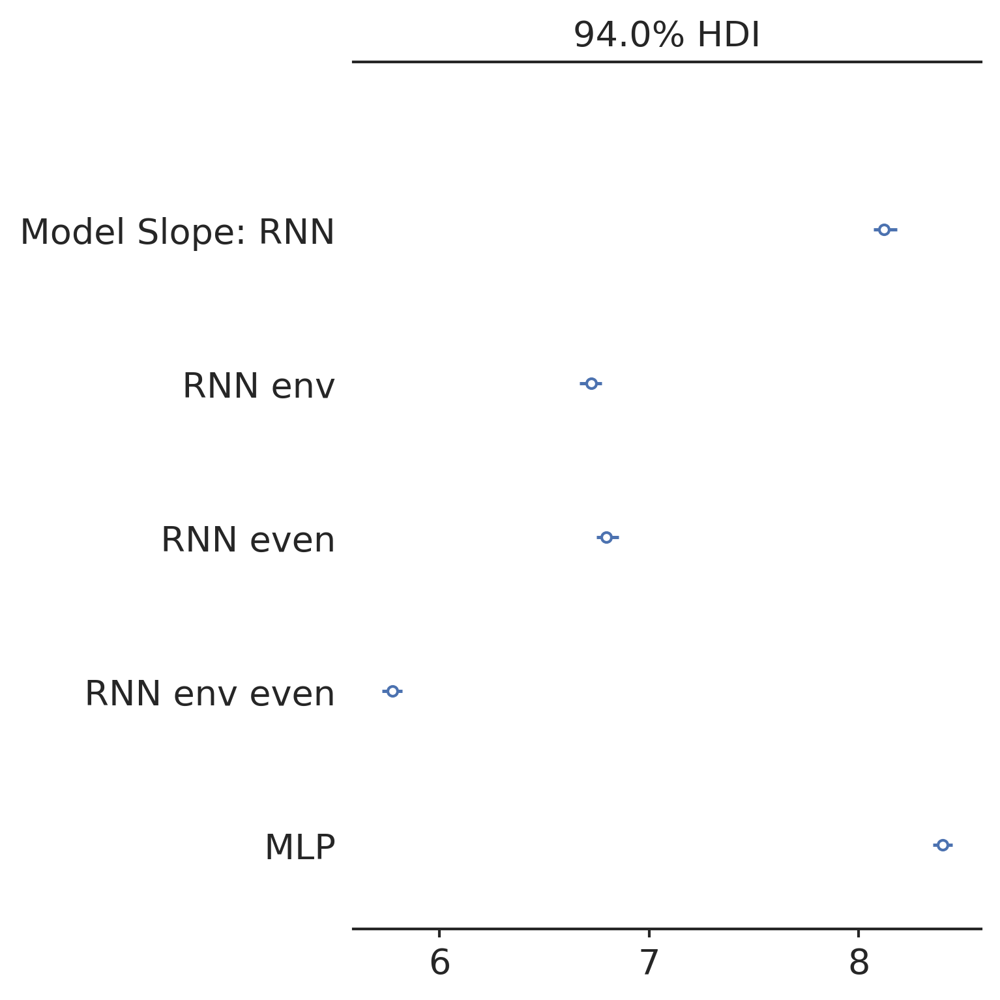

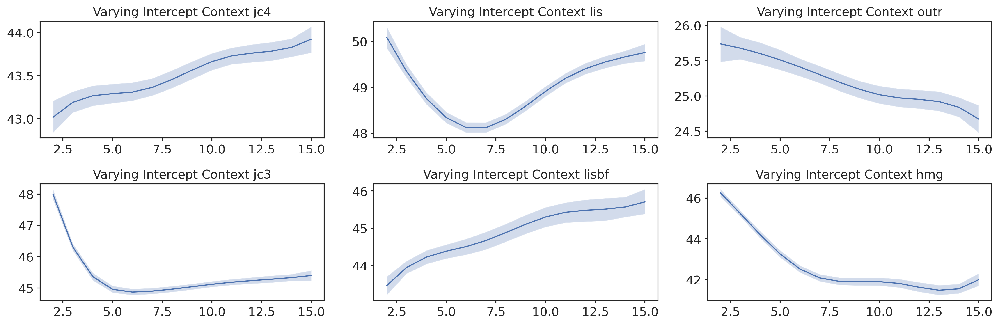

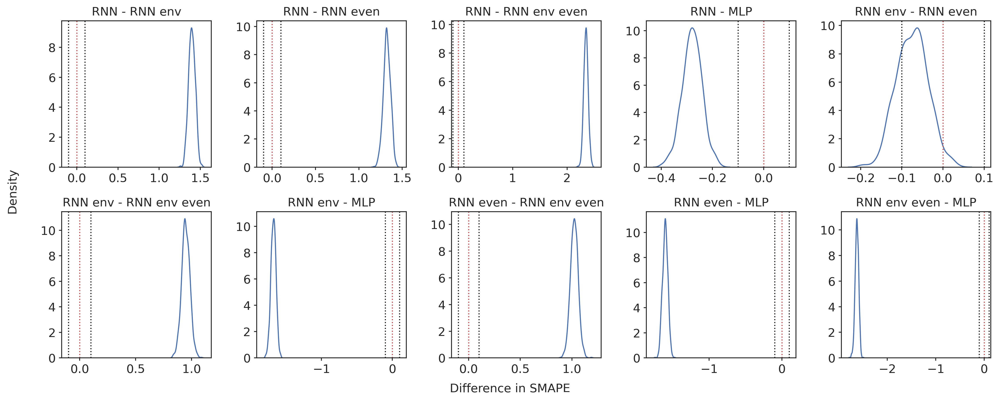

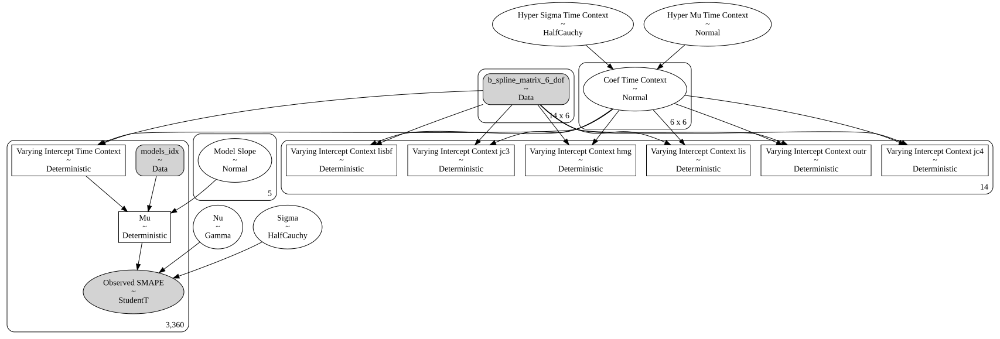

Finished [100%]: Average Loss = -441.31
INFO:pymc3.variational.inference:Finished [100%]: Average Loss = -441.31


Future Active Time


arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)
arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Varying Intercept Context jc4[0],8.541,0.025,8.497,8.589,0.001,0.001,922.0,906.0,NaN
Varying Intercept Context jc4[1],8.604,0.018,8.571,8.636,0.001,0.000,934.0,874.0,NaN
Varying Intercept Context jc4[2],8.751,0.018,8.719,8.786,0.001,0.000,977.0,940.0,NaN
Varying Intercept Context jc4[3],8.947,0.017,8.914,8.977,0.001,0.000,971.0,974.0,NaN
Varying Intercept Context jc4[4],9.161,0.016,9.132,9.189,0.001,0.000,951.0,943.0,NaN
Varying Intercept Context jc4[5],9.361,0.016,9.334,9.392,0.001,0.000,944.0,936.0,NaN
Varying Intercept Context jc4[6],9.537,0.016,9.509,9.568,0.001,0.000,941.0,905.0,NaN
Varying Intercept Context jc4[7],9.694,0.016,9.667,9.726,0.001,0.000,960.0,899.0,NaN
Varying Intercept Context jc4[8],9.835,0.016,9.806,9.867,0.001,0.000,988.0,1070.0,NaN
Varying Intercept Context jc4[9],9.963,0.017,9.929,9.994,0.001,0.000,1001.0,979.0,NaN


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Model Slope[0],5.736,0.007,5.722,5.749,0.000,0.000,966.0,983.0,NaN
Model Slope[1],5.702,0.008,5.688,5.716,0.000,0.000,811.0,834.0,NaN
Model Slope[2],5.669,0.007,5.655,5.683,0.000,0.000,865.0,864.0,NaN
Model Slope[3],5.710,0.007,5.696,5.723,0.000,0.000,1149.0,1021.0,NaN
Model Slope[4],5.998,0.008,5.984,6.015,0.000,0.000,997.0,978.0,NaN
Nu,4.079,0.235,3.605,4.472,0.008,0.006,886.0,983.0,NaN
Sigma,0.148,0.003,0.143,0.153,0.000,0.000,939.0,931.0,NaN


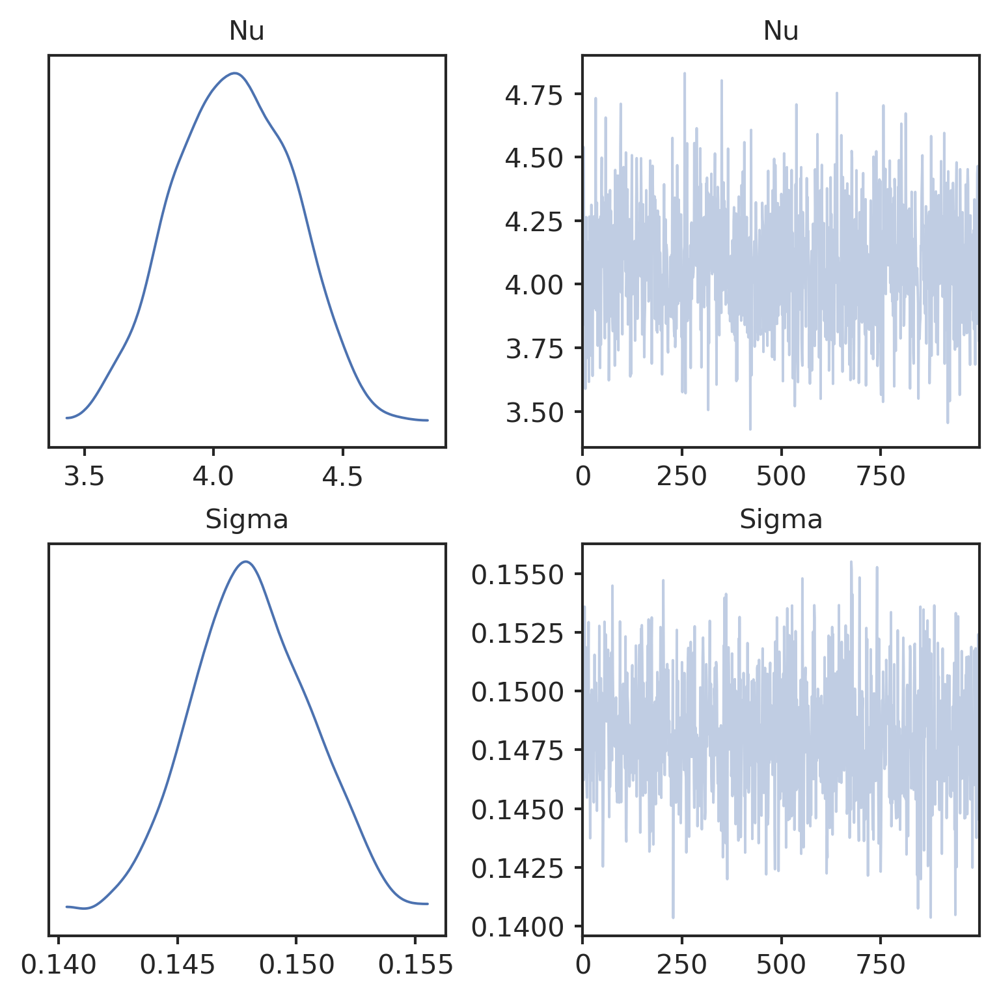

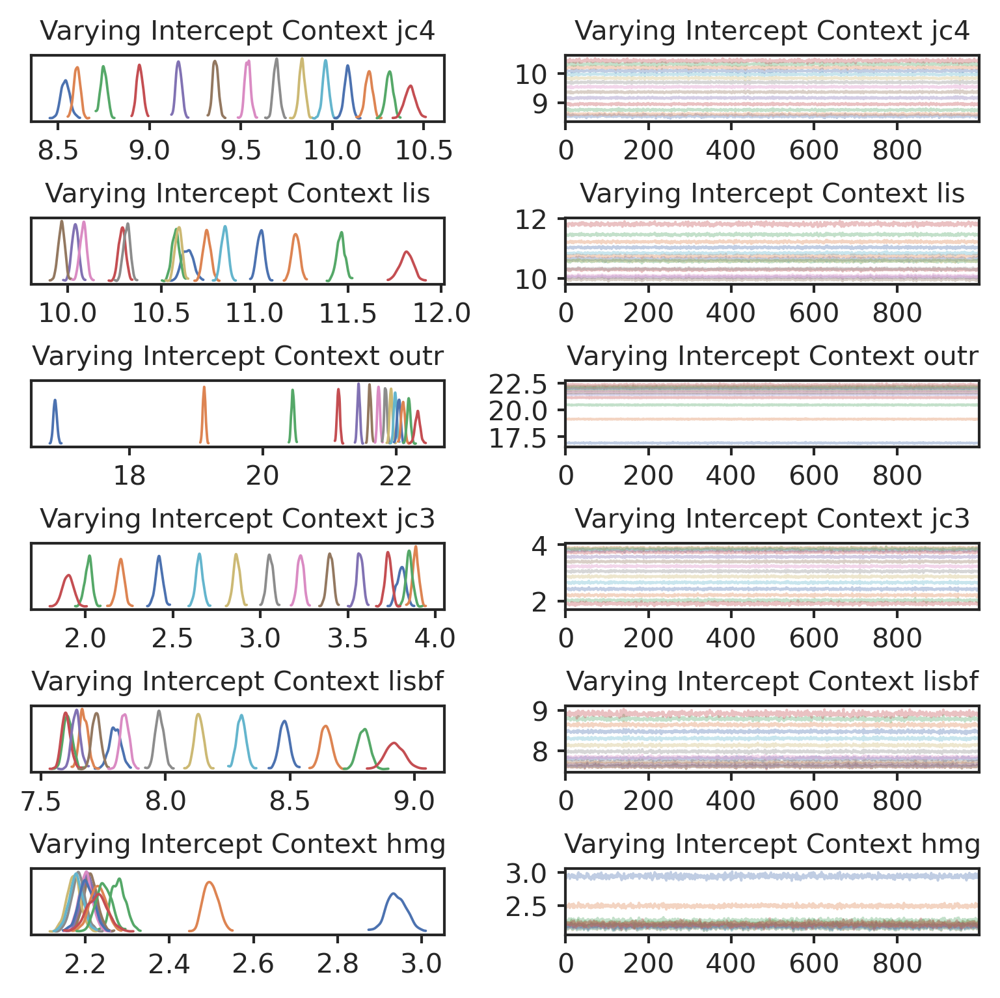

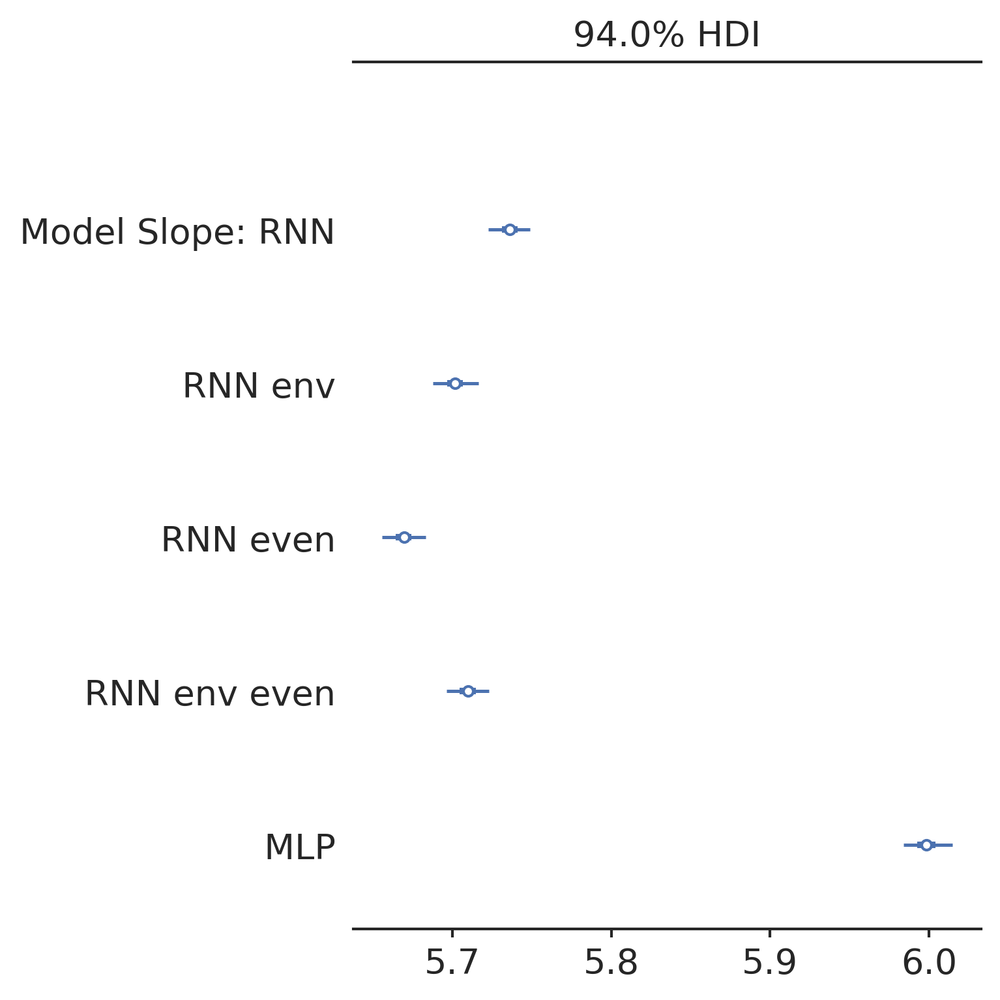

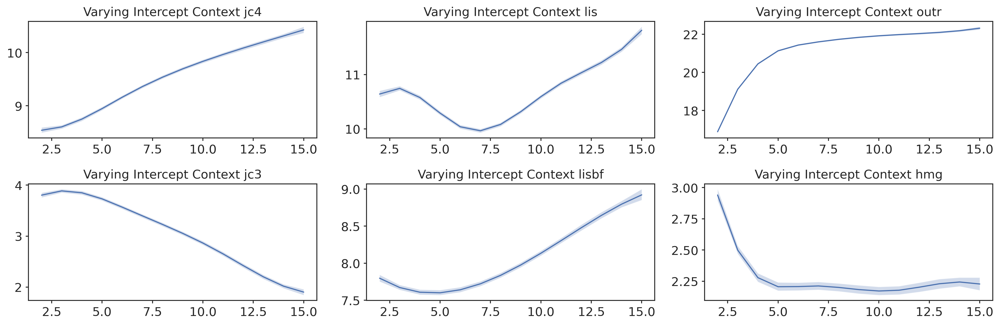

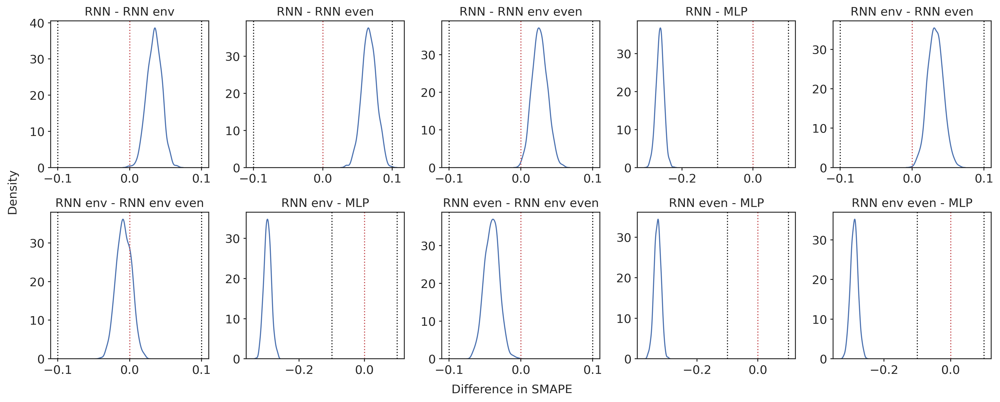

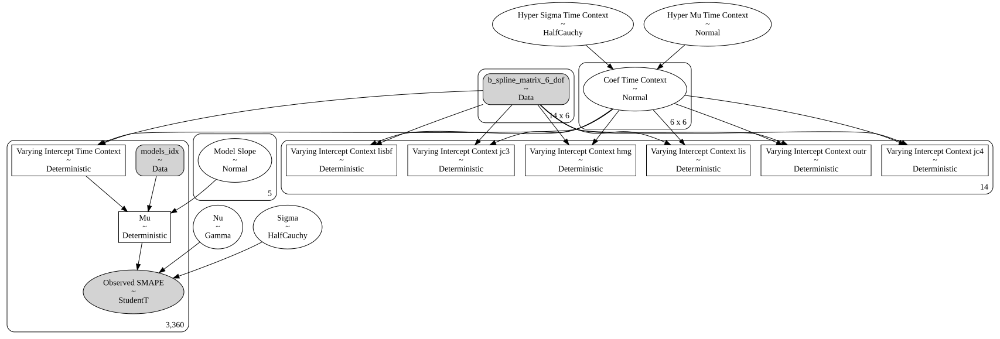

Finished [100%]: Average Loss = 1,747.1
INFO:pymc3.variational.inference:Finished [100%]: Average Loss = 1,747.1


Future Session Time


arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)
arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Varying Intercept Context jc4[0],29.467,0.052,29.378,29.572,0.002,0.001,828.0,874.0,NaN
Varying Intercept Context jc4[1],29.400,0.037,29.334,29.472,0.001,0.001,859.0,1014.0,NaN
Varying Intercept Context jc4[2],29.379,0.040,29.310,29.454,0.001,0.001,911.0,955.0,NaN
Varying Intercept Context jc4[3],29.389,0.038,29.317,29.455,0.001,0.001,900.0,1026.0,NaN
Varying Intercept Context jc4[4],29.420,0.035,29.360,29.489,0.001,0.001,911.0,970.0,NaN
Varying Intercept Context jc4[5],29.459,0.034,29.394,29.521,0.001,0.001,935.0,771.0,NaN
Varying Intercept Context jc4[6],29.500,0.034,29.433,29.558,0.001,0.001,949.0,952.0,NaN
Varying Intercept Context jc4[7],29.538,0.034,29.472,29.599,0.001,0.001,963.0,872.0,NaN
Varying Intercept Context jc4[8],29.573,0.035,29.509,29.636,0.001,0.001,984.0,906.0,NaN
Varying Intercept Context jc4[9],29.599,0.036,29.525,29.659,0.001,0.001,985.0,1025.0,NaN


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Model Slope[0],10.777,0.014,10.752,10.805,0.000,0.000,823.0,872.0,NaN
Model Slope[1],10.827,0.014,10.801,10.856,0.000,0.000,1222.0,1071.0,NaN
Model Slope[2],10.106,0.015,10.080,10.135,0.000,0.000,1186.0,1022.0,NaN
Model Slope[3],10.045,0.015,10.017,10.072,0.001,0.000,688.0,931.0,NaN
Model Slope[4],10.862,0.014,10.837,10.889,0.000,0.000,932.0,975.0,NaN
Nu,33.640,10.274,18.270,55.072,0.335,0.237,931.0,969.0,NaN
Sigma,0.337,0.005,0.328,0.346,0.000,0.000,1080.0,906.0,NaN


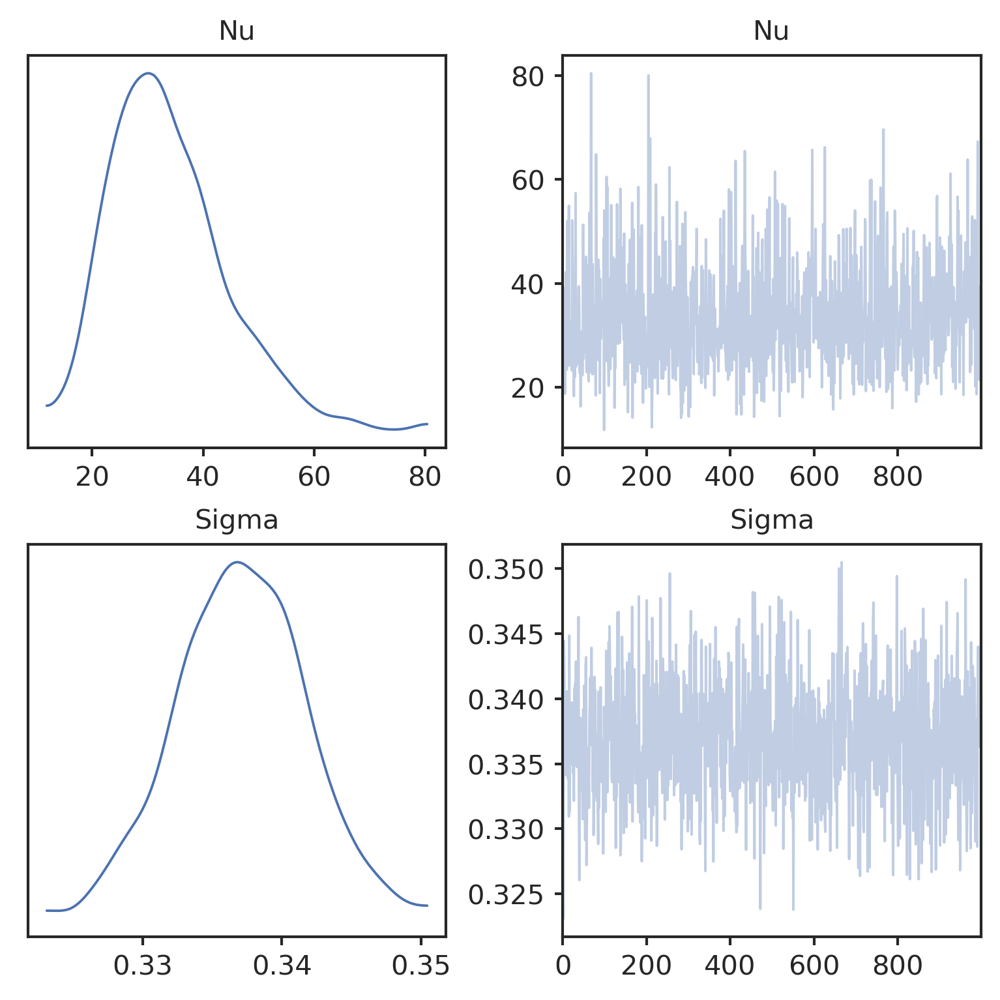

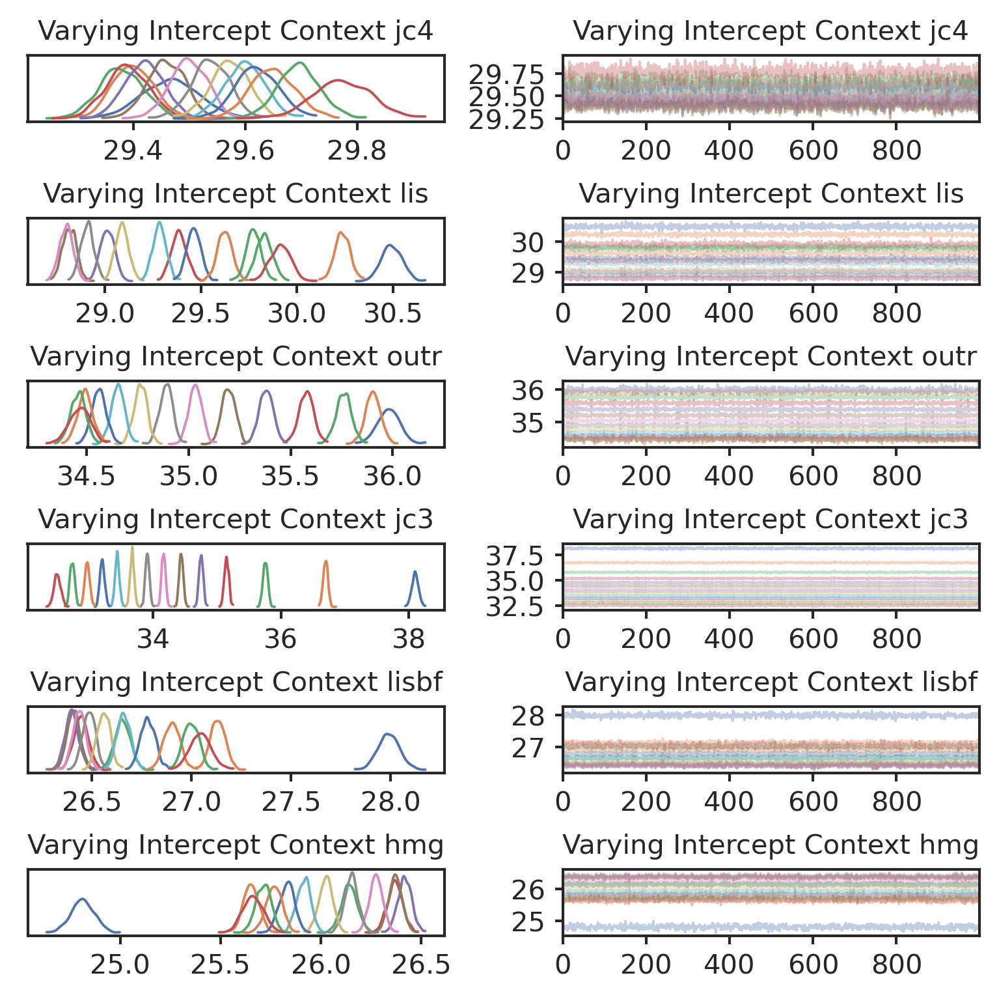

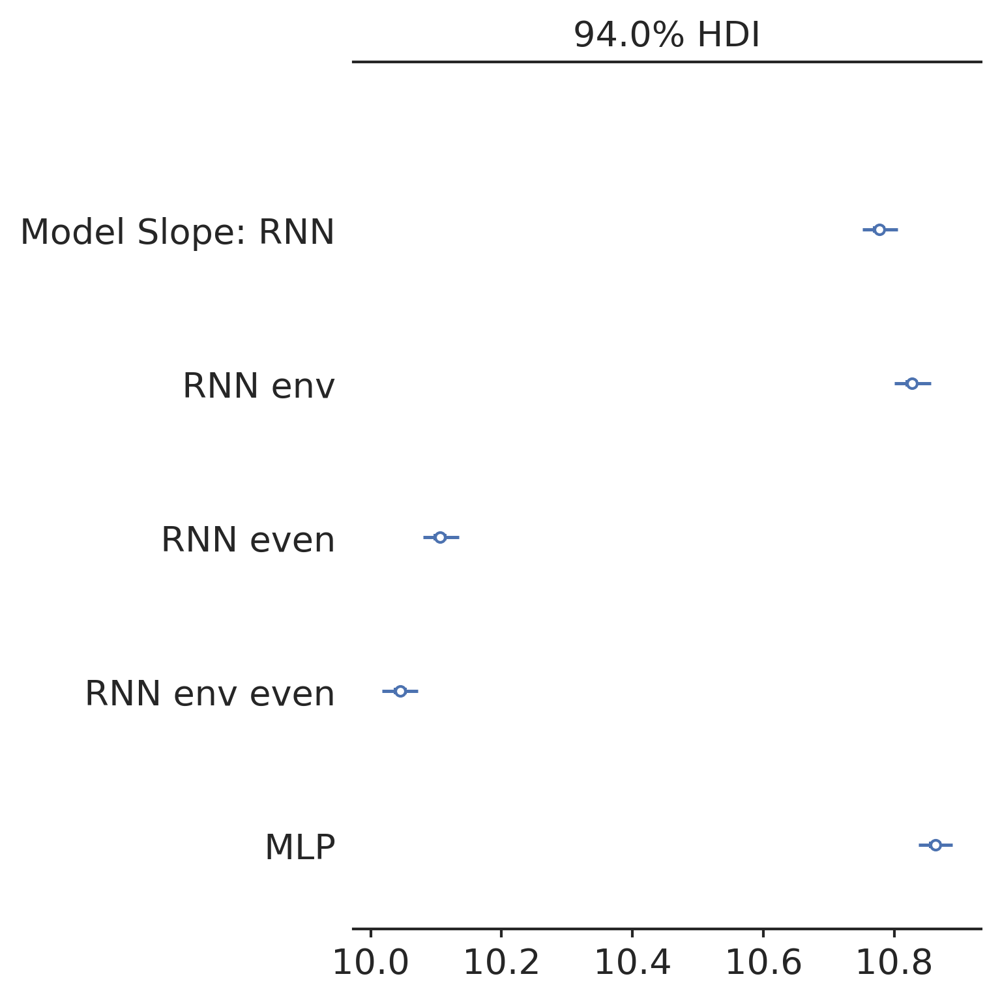

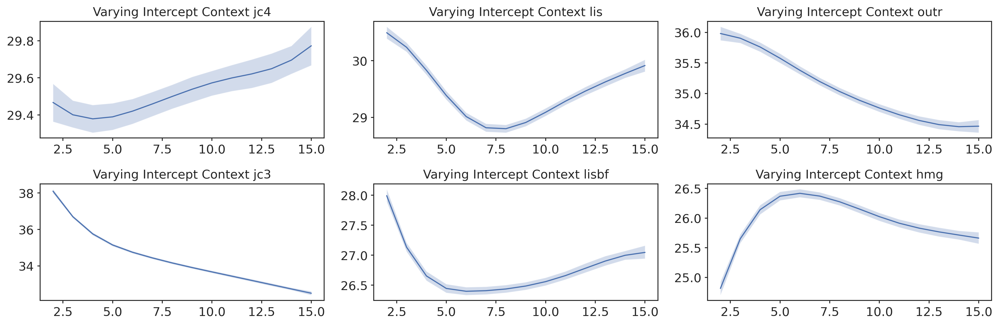

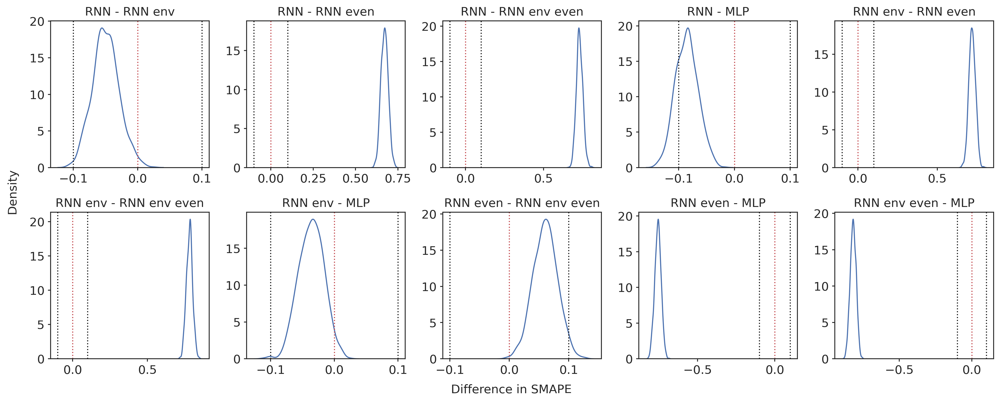

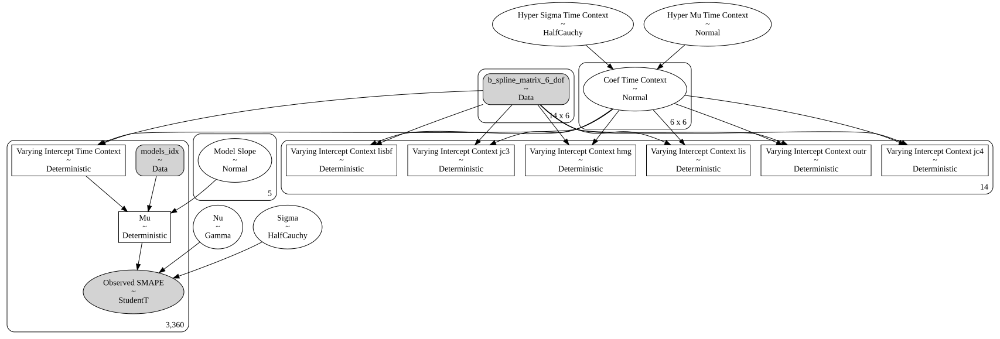

Finished [100%]: Average Loss = 3,502.6
INFO:pymc3.variational.inference:Finished [100%]: Average Loss = 3,502.6


Future Session Activity


arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)
arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Varying Intercept Context jc4[0],29.773,0.097,29.609,29.979,0.003,0.002,924.0,975.0,NaN
Varying Intercept Context jc4[1],32.065,0.067,31.938,32.186,0.002,0.001,1126.0,889.0,NaN
Varying Intercept Context jc4[2],33.278,0.066,33.154,33.399,0.002,0.001,1080.0,933.0,NaN
Varying Intercept Context jc4[3],33.762,0.062,33.648,33.877,0.002,0.001,944.0,960.0,NaN
Varying Intercept Context jc4[4],33.868,0.058,33.772,33.986,0.002,0.001,889.0,890.0,NaN
Varying Intercept Context jc4[5],33.928,0.057,33.821,34.034,0.002,0.001,918.0,956.0,NaN
Varying Intercept Context jc4[6],34.059,0.058,33.947,34.163,0.002,0.001,978.0,940.0,NaN
Varying Intercept Context jc4[7],34.241,0.058,34.134,34.357,0.002,0.001,1013.0,980.0,NaN
Varying Intercept Context jc4[8],34.454,0.059,34.337,34.563,0.002,0.001,992.0,1020.0,NaN
Varying Intercept Context jc4[9],34.674,0.060,34.570,34.795,0.002,0.001,963.0,943.0,NaN


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Model Slope[0],7.715,0.028,7.663,7.766,0.001,0.001,972.0,918.0,NaN
Model Slope[1],7.893,0.022,7.858,7.940,0.001,0.000,1021.0,1026.0,NaN
Model Slope[2],7.248,0.019,7.213,7.285,0.001,0.000,805.0,945.0,NaN
Model Slope[3],7.068,0.021,7.029,7.105,0.001,0.000,1041.0,865.0,NaN
Model Slope[4],8.385,0.023,8.343,8.429,0.001,0.001,848.0,753.0,NaN
Nu,2.860,0.136,2.611,3.112,0.004,0.003,948.0,942.0,NaN
Sigma,0.421,0.008,0.405,0.436,0.000,0.000,1073.0,933.0,NaN


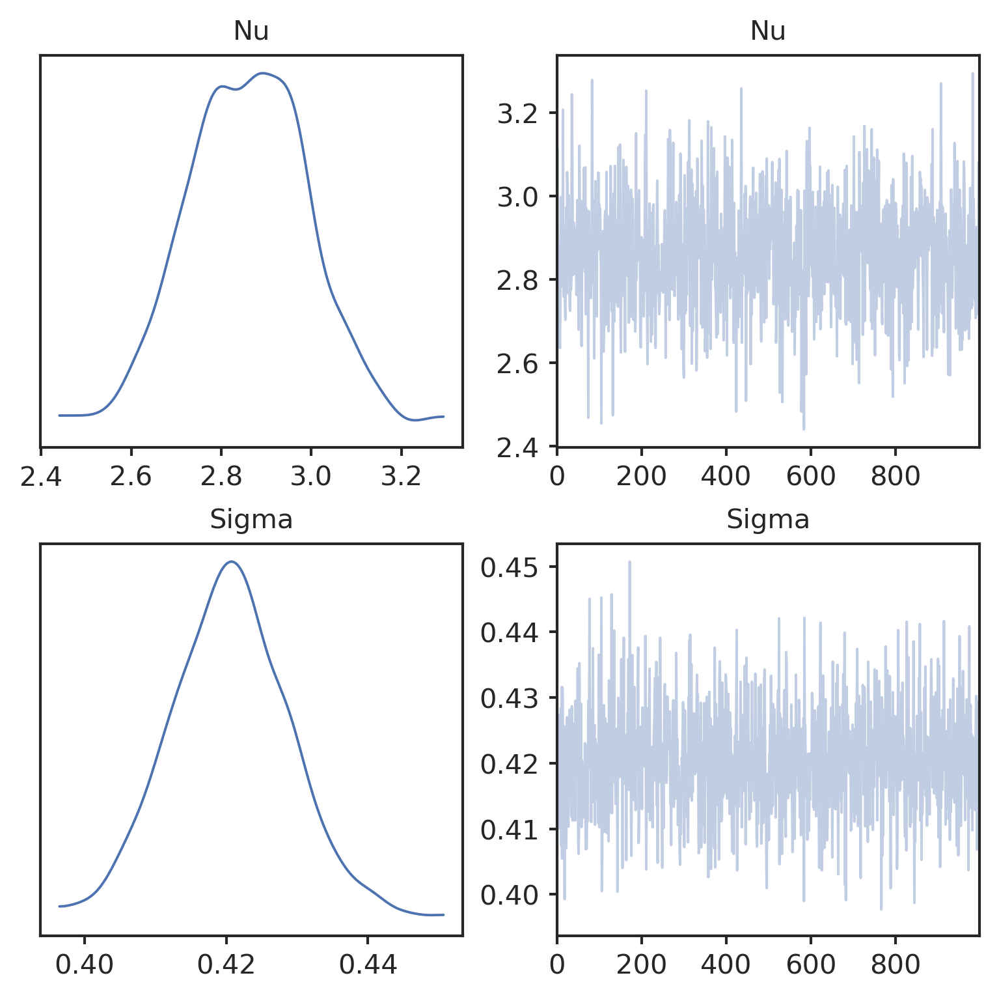

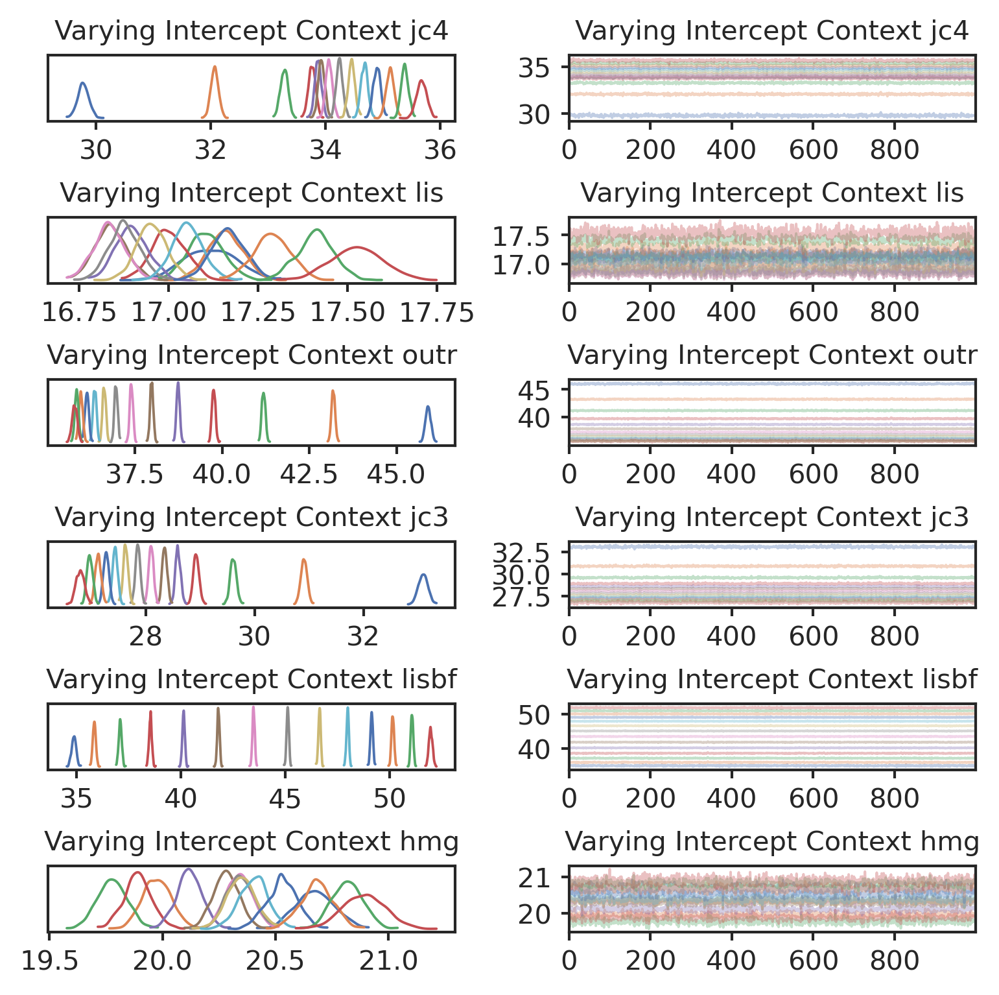

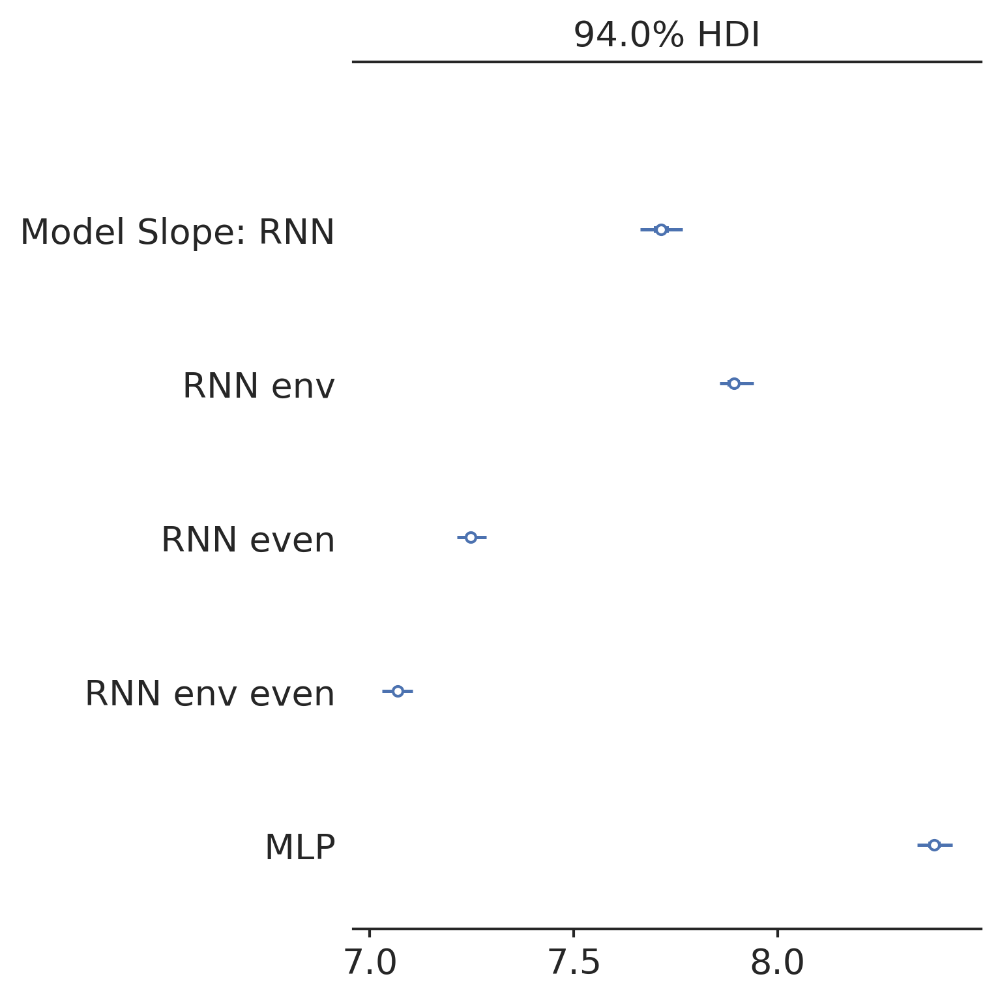

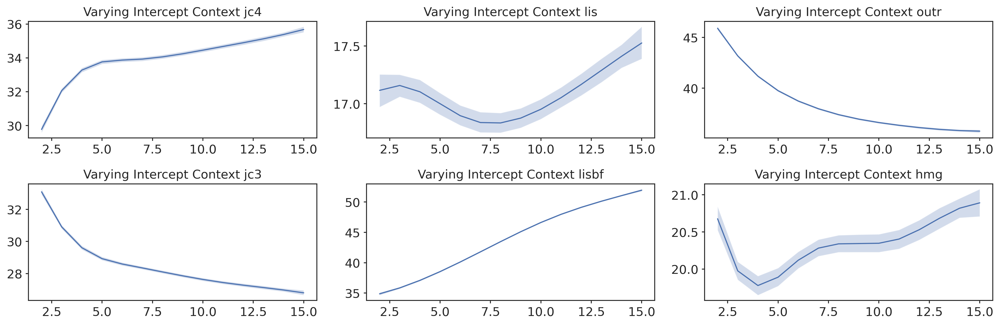

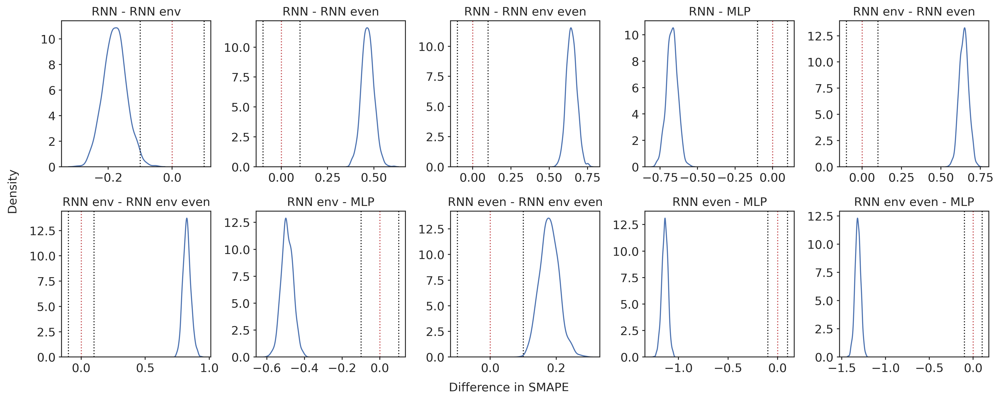

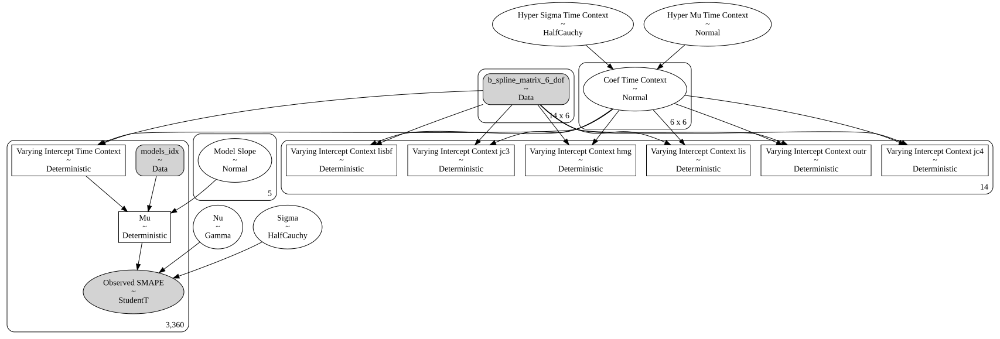

Finished [100%]: Average Loss = 6,153.6
INFO:pymc3.variational.inference:Finished [100%]: Average Loss = 6,153.6


Future N° Sessions


arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)
arviz - WARNING - Shape validation failed: input_shape: (1, 1000), minimum_shape: (chains=2, draws=4)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Varying Intercept Context jc4[0],54.174,0.228,53.768,54.621,0.007,0.005,1001.0,915.0,NaN
Varying Intercept Context jc4[1],44.607,0.141,44.350,44.864,0.004,0.003,1036.0,983.0,NaN
Varying Intercept Context jc4[2],39.338,0.131,39.114,39.603,0.004,0.003,945.0,875.0,NaN
Varying Intercept Context jc4[3],37.047,0.119,36.867,37.305,0.004,0.003,884.0,842.0,NaN
Varying Intercept Context jc4[4],36.418,0.105,36.233,36.612,0.004,0.003,875.0,936.0,NaN
Varying Intercept Context jc4[5],36.202,0.100,36.014,36.379,0.003,0.002,896.0,979.0,NaN
Varying Intercept Context jc4[6],35.958,0.097,35.787,36.140,0.003,0.002,914.0,1072.0,NaN
Varying Intercept Context jc4[7],35.770,0.095,35.615,35.966,0.003,0.002,928.0,1026.0,NaN
Varying Intercept Context jc4[8],35.726,0.094,35.551,35.906,0.003,0.002,941.0,915.0,NaN
Varying Intercept Context jc4[9],35.917,0.095,35.738,36.097,0.003,0.002,952.0,982.0,NaN


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Model Slope[0],2.606,0.048,2.515,2.694,0.001,0.001,1048.0,908.0,NaN
Model Slope[1],1.521,0.042,1.437,1.596,0.001,0.001,969.0,937.0,NaN
Model Slope[2],1.130,0.044,1.058,1.225,0.002,0.001,745.0,942.0,NaN
Model Slope[3],0.361,0.041,0.282,0.436,0.001,0.001,958.0,815.0,NaN
Model Slope[4],3.835,0.071,3.703,3.973,0.002,0.002,1071.0,940.0,NaN
Nu,2.272,0.093,2.097,2.440,0.003,0.002,1107.0,832.0,NaN
Sigma,0.878,0.017,0.846,0.909,0.001,0.000,1092.0,944.0,NaN


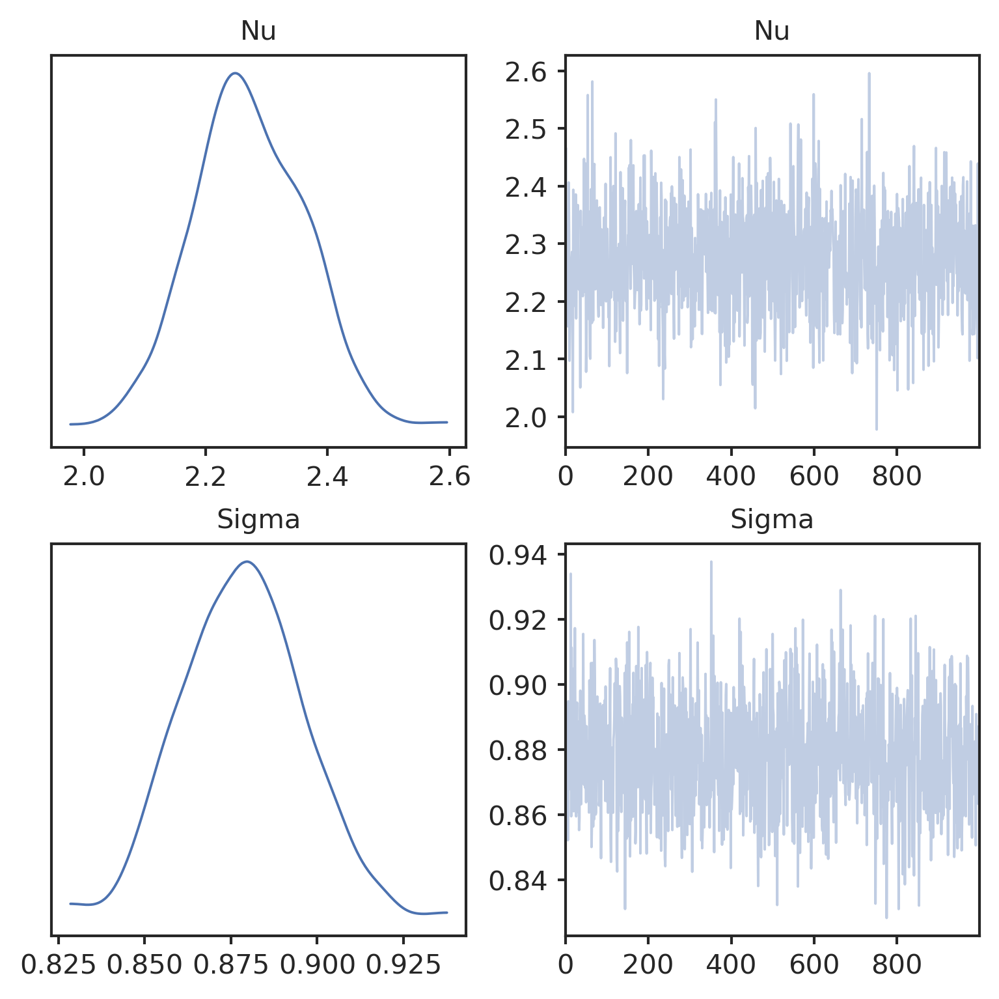

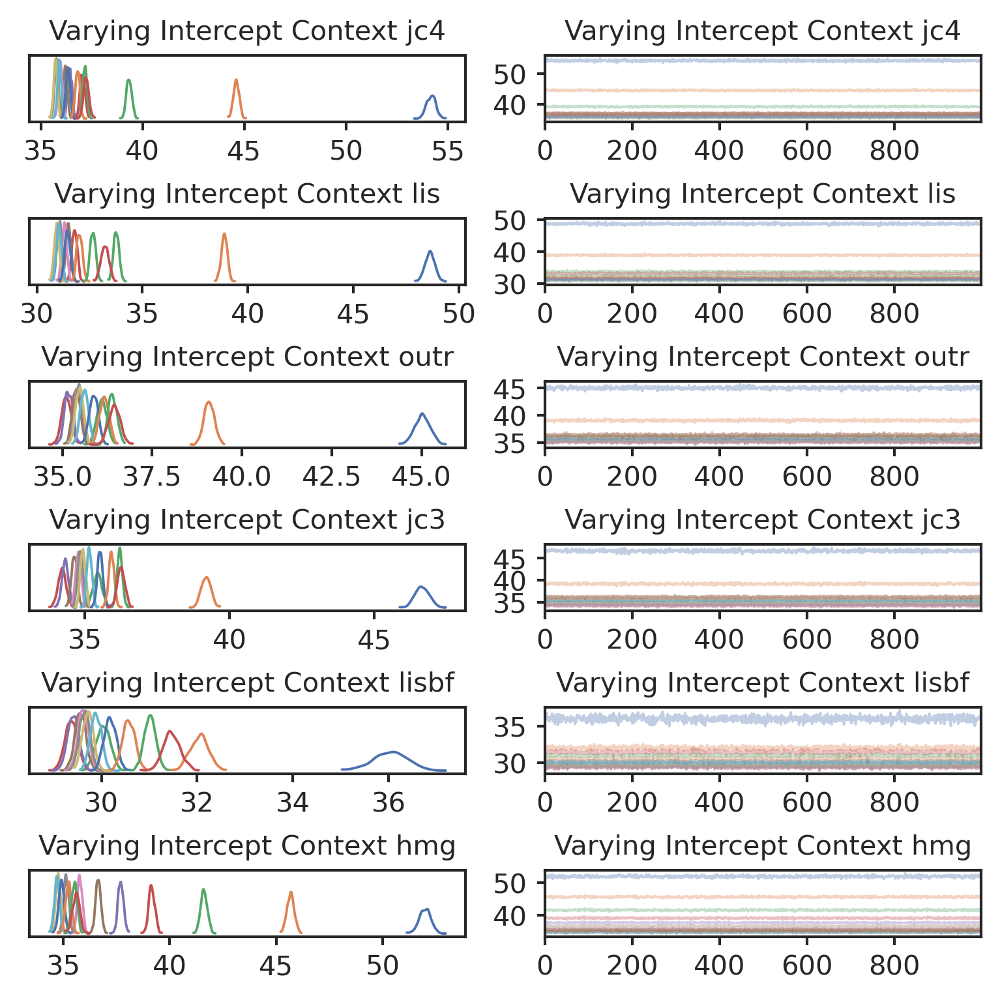

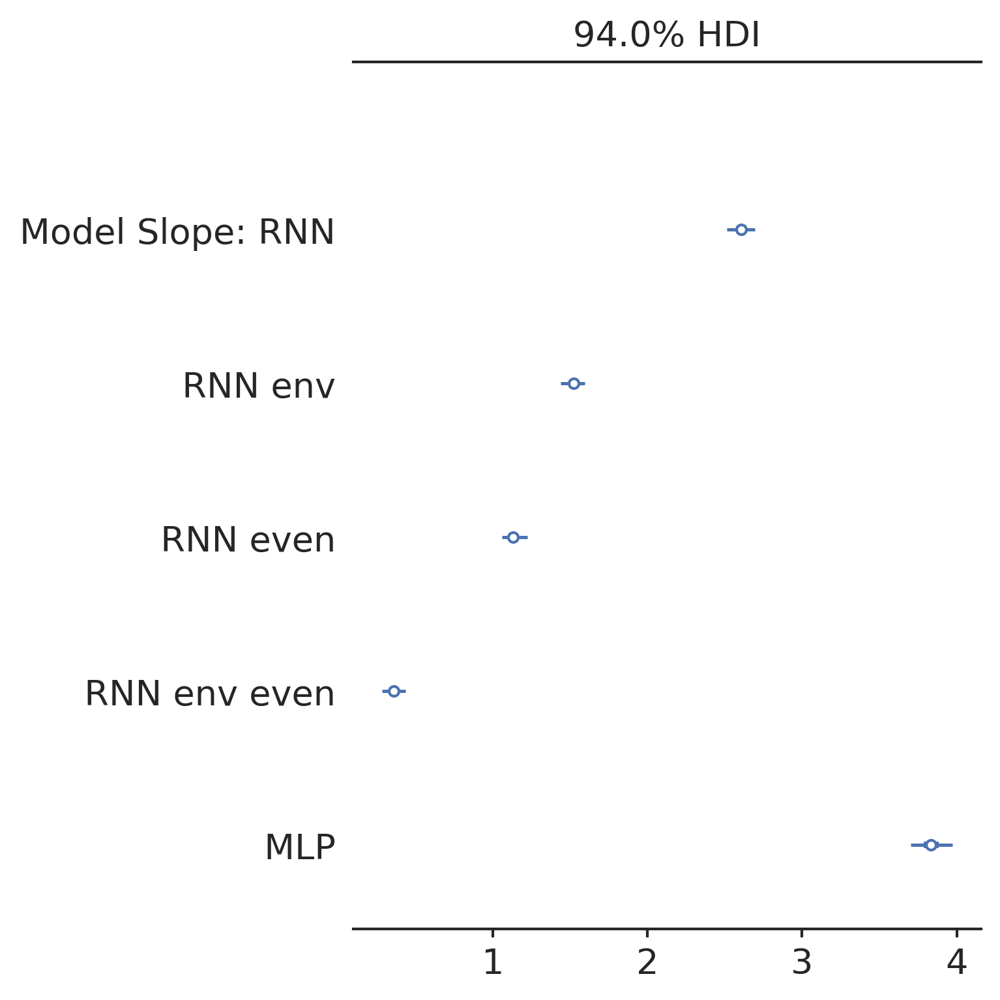

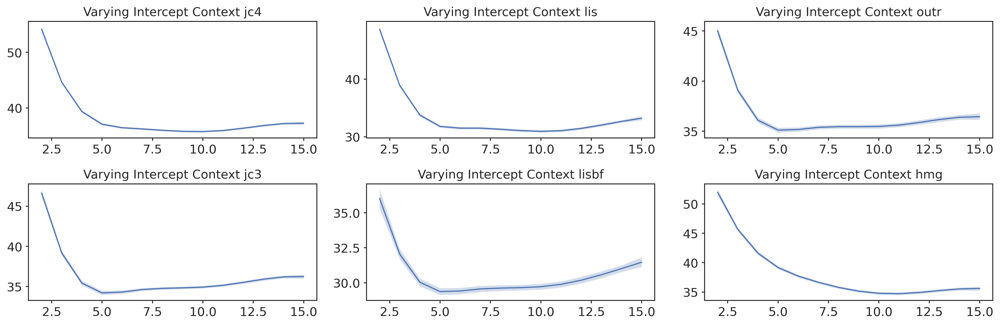

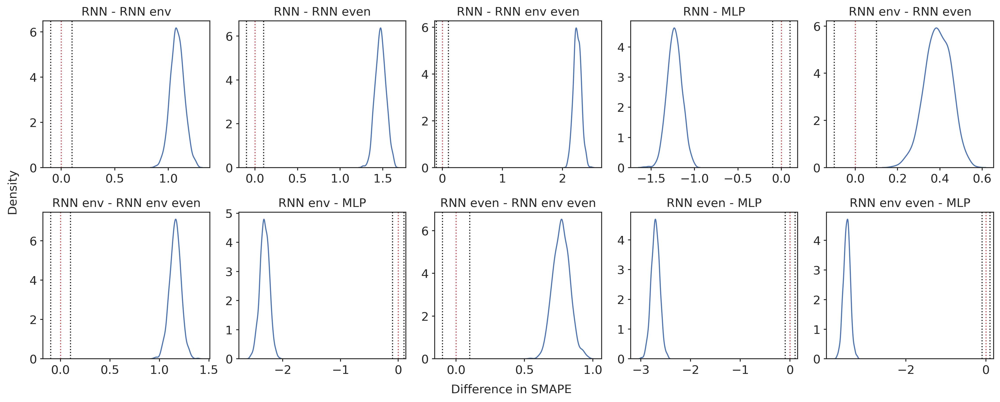

In [16]:
final_results["Session_corr"] = final_results["Session"] - 2
model = LMMPerformance(
    df=final_results, 
    models_column='Model', 
    contexts_column='context', 
    time_column='Session_corr',
    targets_column='target', 
    outcomes_column='value', 
    robust=True
)
model.analyze(
    targets=final_results['target'].unique(), 
    approx=True, 
    n=800000
)

# Final Plot

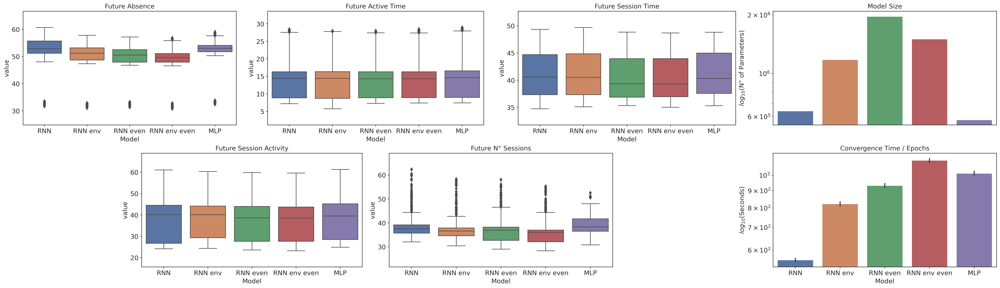

In [53]:
fig = plt.figure(constrained_layout=True, figsize=(28, 8))
spec = fig.add_gridspec(2, 8)


axs_metrics = [
    fig.add_subplot(spec[0, 0:2]),
    fig.add_subplot(spec[0, 2:4]),
    fig.add_subplot(spec[0, 4:6]),
    fig.add_subplot(spec[1, 1:3]),
    fig.add_subplot(spec[1, 3:5])
]
ax_size = fig.add_subplot(spec[0, 6:8])
ax_time = fig.add_subplot(spec[1, 6:8])

########################################################################

index=0
for target, ax_metric in zip(targets, axs_metrics):

    sns.boxplot(
        x='Model',
        y='value',
        data=final_results[final_results['target'] == target],
        order=['RNN', 'RNN env', 'RNN even', 'RNN env even', 'MLP'],
        ax=ax_metric,
        showfliers=True
    )
    y_limits = ax_metric.get_ylim()
    
    ax_metric.set_title(target)
    if index == 0:
        ax.set_ylabel('% Error')
        ax.set_xlabel('')
        ax.set_xticks([])
    elif index == 3:
         ax.set_ylabel('% Error')
    elif index in [1, 2]:
        ax.set_ylabel('')
        ax.set_xlabel('')
        ax.set_xticks([])
    else:
        ax.set_ylabel('')
    ax_metric.margins(y=0.20)
    
    index+=1

sns.barplot(
    x='Model',
    y='parameters',
    data=final_results,
    order=['RNN', 'RNN env', 'RNN even', 'RNN env even', 'MLP'],
    ax=ax_size
)
ax_size.set_xlabel('')
ax_size.set_xticks([])
ax_size.set_yscale('log')
ax_size.set_title('Model Size')
ax_size.set_ylabel('$log_{10}$(N° of Parameters)')

sns.barplot(
    x='Model',
    y='time_epochs',
    data=final_results,
    order=['RNN', 'RNN env', 'RNN even', 'RNN env even', 'MLP'],
    ax=ax_time
)
ax_time.set_xlabel('Model')
ax_time.set_yscale('log')
ax_time.set_title('Convergence Time / Epochs')
ax_time.set_ylabel('$log_{10}$(Seconds)')
plt.savefig("results\\figures\\models_performance\\performance_exploded.png", dpi=300)
plt.show()